In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_style('darkgrid')
plt.rcParams['figure.figsize'] = (20, 25)
plt.rcParams['figure.dpi'] = 250
%matplotlib inline
import warnings
warnings.filterwarnings('ignore')

In [2]:
# Q1
df = pd.read_csv(r"C:\Users\ahmed\Downloads\50_Startups.csv")
df

,R&D Spend,Administration,Marketing Spend,State,Profit
0,165349.20,136897.80,471784.10,New York,192261.83
1,162597.70,151377.59,443898.53,California,191792.06
2,153441.51,101145.55,407934.54,Florida,191050.39
3,144372.41,118671.85,383199.62,New York,182901.99
4,142107.34,91391.77,366168.42,Florida,166187.94
5,131876.90,99814.71,362861.36,New York,156991.12
6,134615.46,147198.87,127716.82,California,156122.51
7,130298.13,145530.06,323876.68,Florida,155752.60
8,120542.52,148718.95,311613.29,New York,152211.77
9,123334.88,108679.17,304981.62,California,149759.96


In [3]:
df.describe(include = object)

,State
count,50
unique,3
top,New York
freq,17


In [4]:
df.describe()

,R&D Spend,Administration,Marketing Spend,Profit
count,50.000000,50.000000,50.000000,50.000000
mean,73721.615600,121344.639600,211025.097800,112012.639200
std,45902.256482,28017.802755,122290.310726,40306.180338
min,0.000000,51283.140000,0.000000,14681.400000
25%,39936.370000,103730.875000,129300.132500,90138.902500
50%,73051.080000,122699.795000,212716.240000,107978.190000
75%,101602.800000,144842.180000,299469.085000,139765.977500
max,165349.200000,182645.560000,471784.100000,192261.830000


<Axes: >

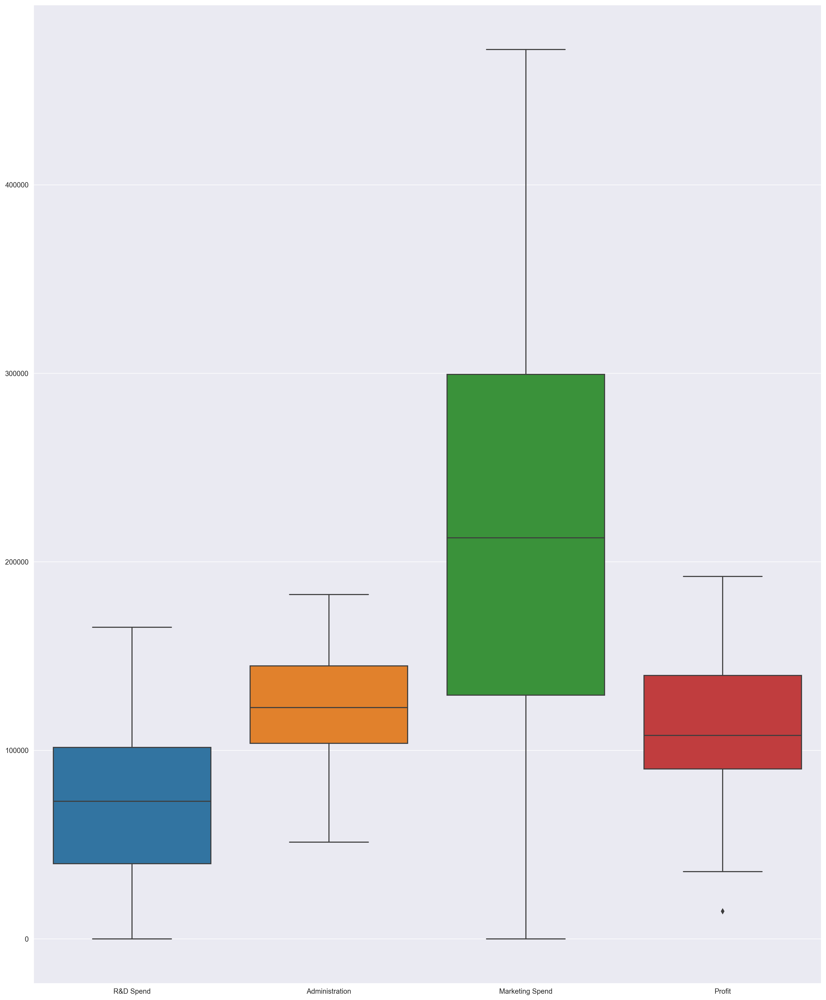

In [5]:
sns.boxplot(df)

In [6]:
# As we can see there is an outlier present in the lower extreme in the target column

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 50 entries, 0 to 49
Data columns (total 5 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   R&D Spend        50 non-null     float64
 1   Administration   50 non-null     float64
 2   Marketing Spend  50 non-null     float64
 3   State            50 non-null     object 
 4   Profit           50 non-null     float64
dtypes: float64(4), object(1)
memory usage: 2.1+ KB


In [8]:
df.duplicated().sum()

0

In [9]:
df['State'].unique()

array(['New York', 'California', 'Florida'], dtype=object)

In [10]:
''' EDA Objectives
1) Encoding
2) Feature Scaling the Columns
3) Renaming the Column
4) Removing Outlier
'''

' EDA Objectives\n1) Encoding\n2) Feature Scaling the Columns\n3) Renaming the Column\n4) Removing Outlier\n'

In [11]:
# Encoding
df = pd.get_dummies(data = df, columns = ['State'])

In [12]:
df.head()

,R&D Spend,Administration,Marketing Spend,Profit,State_California,State_Florida,State_New York
0,165349.20,136897.80,471784.10,192261.83,0,0,1
1,162597.70,151377.59,443898.53,191792.06,1,0,0
2,153441.51,101145.55,407934.54,191050.39,0,1,0
3,144372.41,118671.85,383199.62,182901.99,0,0,1
4,142107.34,91391.77,366168.42,166187.94,0,1,0


In [13]:
# Feature Scaling
from sklearn.preprocessing import StandardScaler

In [14]:
sc = StandardScaler()

In [15]:
sc.fit_transform(df)

array([[ 2.01641149e+00,  5.60752915e-01,  2.15394309e+00,
         2.01120333e+00, -7.17740563e-01, -6.85994341e-01,
         1.39326109e+00],
       [ 1.95586034e+00,  1.08280658e+00,  1.92360040e+00,
         1.99942997e+00,  1.39326109e+00, -6.85994341e-01,
        -7.17740563e-01],
       [ 1.75436374e+00, -7.28257028e-01,  1.62652767e+00,
         1.98084225e+00, -7.17740563e-01,  1.45773797e+00,
        -7.17740563e-01],
       [ 1.55478369e+00, -9.63646307e-02,  1.42221024e+00,
         1.77662724e+00, -7.17740563e-01, -6.85994341e-01,
         1.39326109e+00],
       [ 1.50493720e+00, -1.07991935e+00,  1.28152771e+00,
         1.35774012e+00, -7.17740563e-01,  1.45773797e+00,
        -7.17740563e-01],
       [ 1.27980001e+00, -7.76239071e-01,  1.25421046e+00,
         1.12724963e+00, -7.17740563e-01, -6.85994341e-01,
         1.39326109e+00],
       [ 1.34006641e+00,  9.32147208e-01, -6.88149930e-01,
         1.10548055e+00,  1.39326109e+00, -6.85994341e-01,
        -7.1774056

In [16]:
scaled_data  = pd.DataFrame(sc .fit_transform(df), columns = df.columns)
scaled_data

,R&D Spend,Administration,Marketing Spend,Profit,State_California,State_Florida,State_New York
0,2.016411,0.560753,2.153943,2.011203,-0.717741,-0.685994,1.393261
1,1.955860,1.082807,1.923600,1.999430,1.393261,-0.685994,-0.717741
2,1.754364,-0.728257,1.626528,1.980842,-0.717741,1.457738,-0.717741
3,1.554784,-0.096365,1.422210,1.776627,-0.717741,-0.685994,1.393261
4,1.504937,-1.079919,1.281528,1.357740,-0.717741,1.457738,-0.717741
5,1.279800,-0.776239,1.254210,1.127250,-0.717741,-0.685994,1.393261
6,1.340066,0.932147,-0.688150,1.105481,1.393261,-0.685994,-0.717741
7,1.245057,0.871980,0.932186,1.096210,-0.717741,1.457738,-0.717741
8,1.030369,0.986952,0.830887,1.007470,-0.717741,-0.685994,1.393261
9,1.091819,-0.456640,0.776107,0.946022,1.393261,-0.685994,-0.717741


In [17]:
# Removing Outliers
def outlier_detection (data, colname):
    q1 = data[colname].quantile(0.25)
    q3 = data[colname].quantile(0.75)
    iqr = q3-q1
    lower = q1 - (1.5 * iqr)
    upper = q1 + (1.5 * iqr)
    return lower, upper

In [18]:
l, u = outlier_detection(scaled_data, 'Profit')

In [19]:
l

-2.413827956562489

In [20]:
# Capping Outliers
scaled_data.loc[(scaled_data['Profit'] < l), 'Profit'] = l

<Axes: >

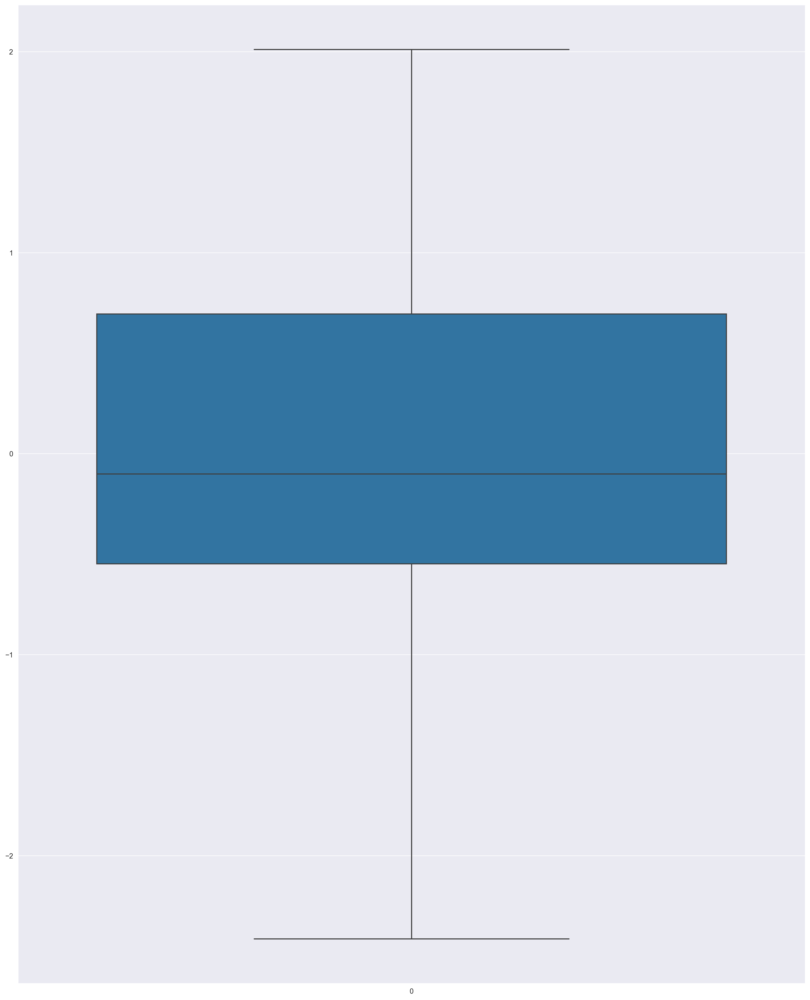

In [21]:
sns.boxplot(scaled_data['Profit'])

In [22]:
scaled_data.head()

,R&D Spend,Administration,Marketing Spend,Profit,State_California,State_Florida,State_New York
0,2.016411,0.560753,2.153943,2.011203,-0.717741,-0.685994,1.393261
1,1.955860,1.082807,1.923600,1.999430,1.393261,-0.685994,-0.717741
2,1.754364,-0.728257,1.626528,1.980842,-0.717741,1.457738,-0.717741
3,1.554784,-0.096365,1.422210,1.776627,-0.717741,-0.685994,1.393261
4,1.504937,-1.079919,1.281528,1.357740,-0.717741,1.457738,-0.717741


In [23]:
# Renaming Column
scaled_data.rename(columns = {'R&D Spend' : 'RD', 'Administration' : 'Admin', 'Marketing Spend' : 'MS', 'State_California' : 'SC', 'State_Florida' : 'SF', 'State_New York' : 'SNY'}, inplace = True)
scaled_data

,RD,Admin,MS,Profit,SC,SF,SNY
0,2.016411,0.560753,2.153943,2.011203,-0.717741,-0.685994,1.393261
1,1.955860,1.082807,1.923600,1.999430,1.393261,-0.685994,-0.717741
2,1.754364,-0.728257,1.626528,1.980842,-0.717741,1.457738,-0.717741
3,1.554784,-0.096365,1.422210,1.776627,-0.717741,-0.685994,1.393261
4,1.504937,-1.079919,1.281528,1.357740,-0.717741,1.457738,-0.717741
5,1.279800,-0.776239,1.254210,1.127250,-0.717741,-0.685994,1.393261
6,1.340066,0.932147,-0.688150,1.105481,1.393261,-0.685994,-0.717741
7,1.245057,0.871980,0.932186,1.096210,-0.717741,1.457738,-0.717741
8,1.030369,0.986952,0.830887,1.007470,-0.717741,-0.685994,1.393261
9,1.091819,-0.456640,0.776107,0.946022,1.393261,-0.685994,-0.717741


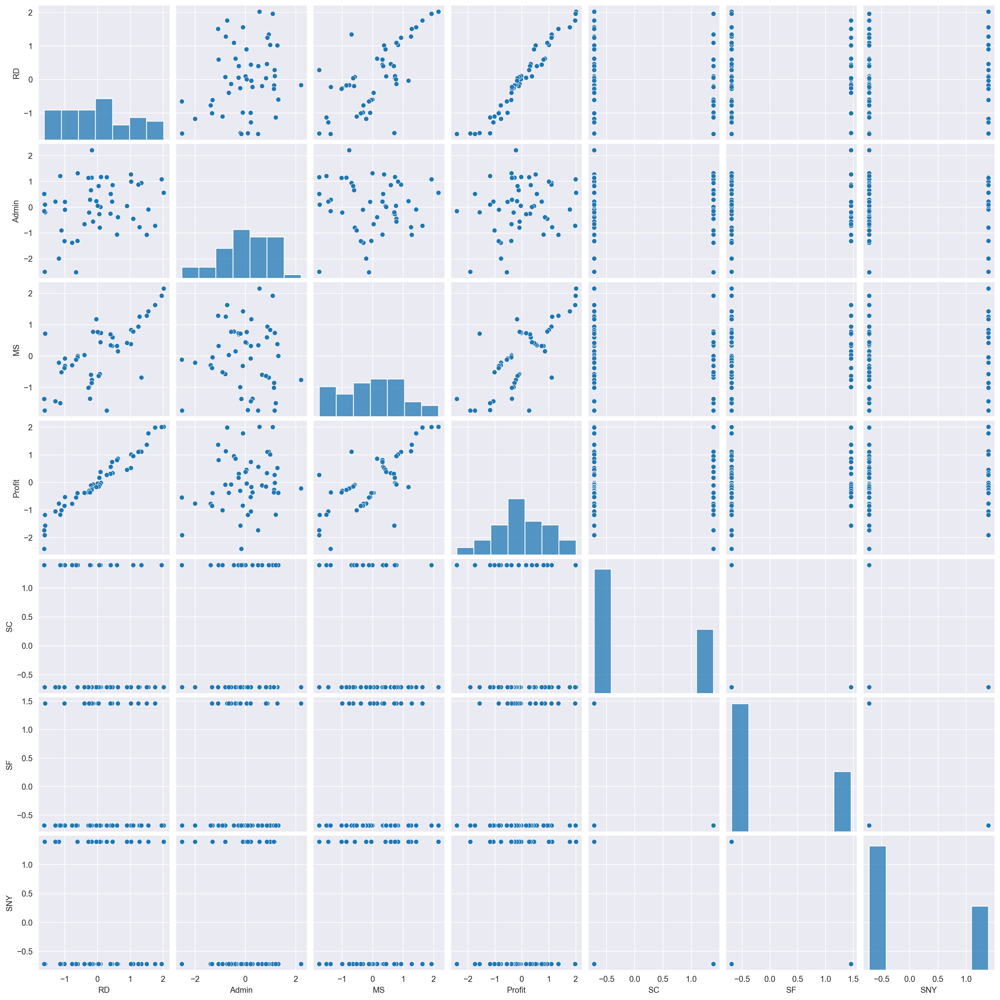

In [24]:
# Checking for Linearity
sns.pairplot(scaled_data)

In [25]:
# We do have some Multicolinearity between our MS and RD column

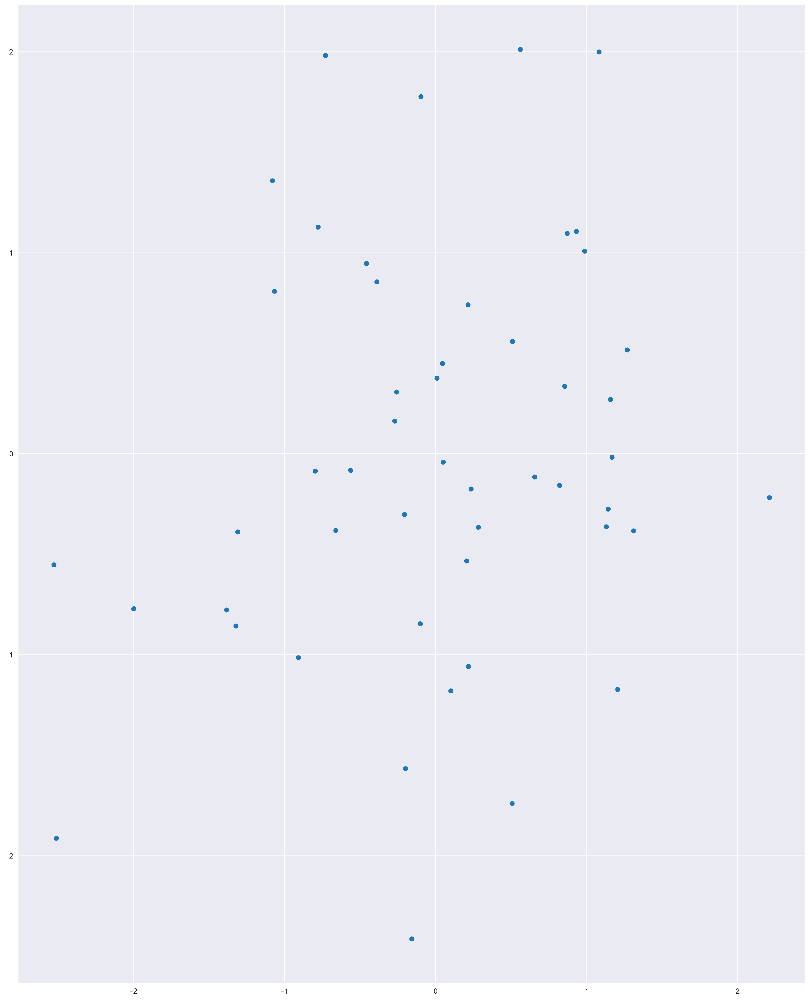

In [26]:
plt.scatter(scaled_data['Admin'], scaled_data['Profit'])

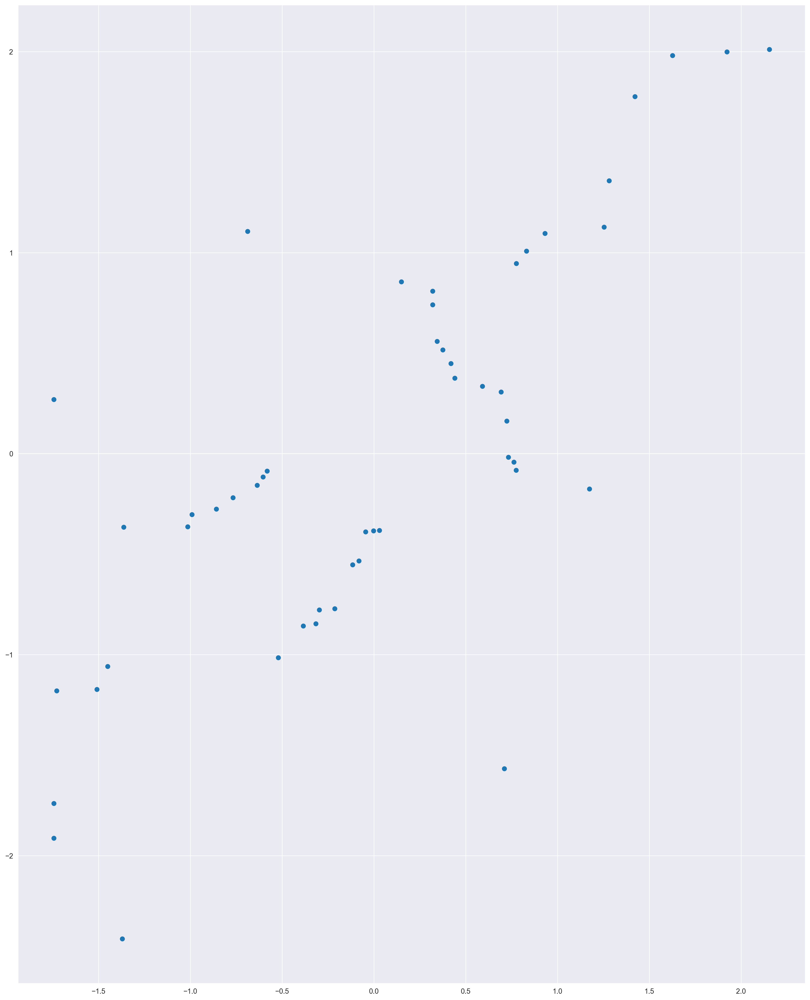

In [27]:
plt.scatter(scaled_data['MS'], scaled_data['Profit'])

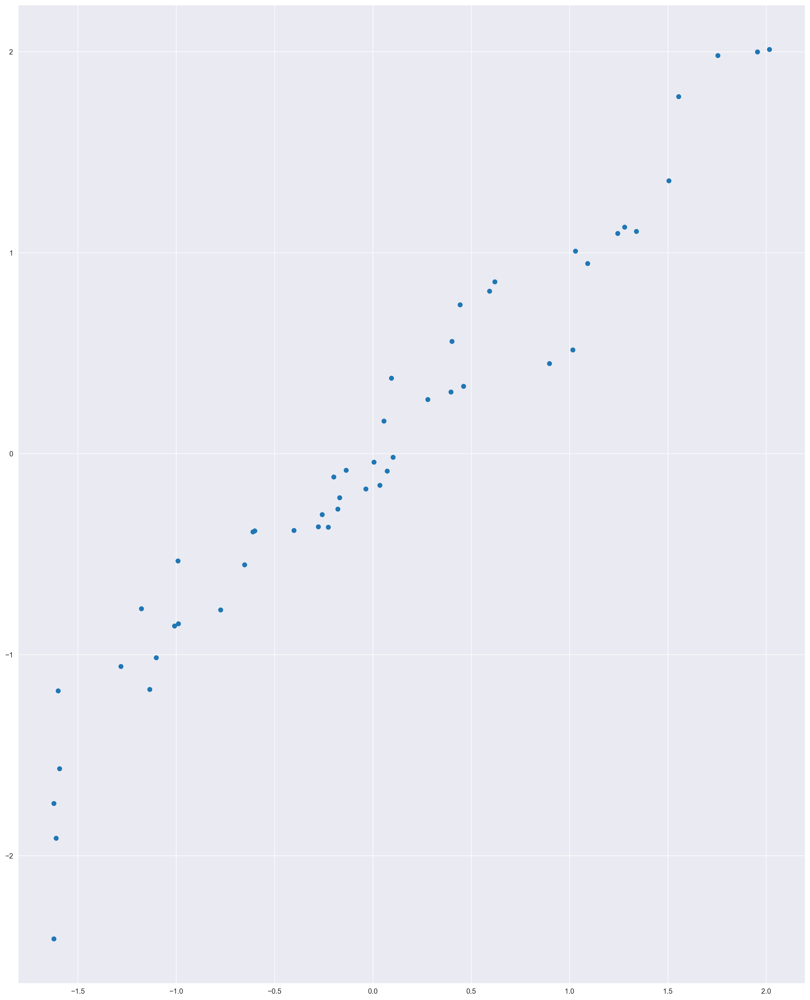

In [28]:
plt.scatter(scaled_data['RD'], scaled_data['Profit'])

In [29]:
scaled_data.corr()

,RD,Admin,MS,Profit,SC,SF,SNY
RD,1.000000,0.241955,0.724248,0.973278,-0.143165,0.105711,0.039068
Admin,0.241955,1.000000,-0.032154,0.200885,-0.015478,0.010493,0.005145
MS,0.724248,-0.032154,1.000000,0.747993,-0.168875,0.205685,-0.033670
Profit,0.973278,0.200885,0.747993,1.000000,-0.145307,0.116038,0.031040
SC,-0.143165,-0.015478,-0.168875,-0.145307,1.000000,-0.492366,-0.515152
SF,0.105711,0.010493,0.205685,0.116038,-0.492366,1.000000,-0.492366
SNY,0.039068,0.005145,-0.033670,0.031040,-0.515152,-0.492366,1.000000


<Axes: >

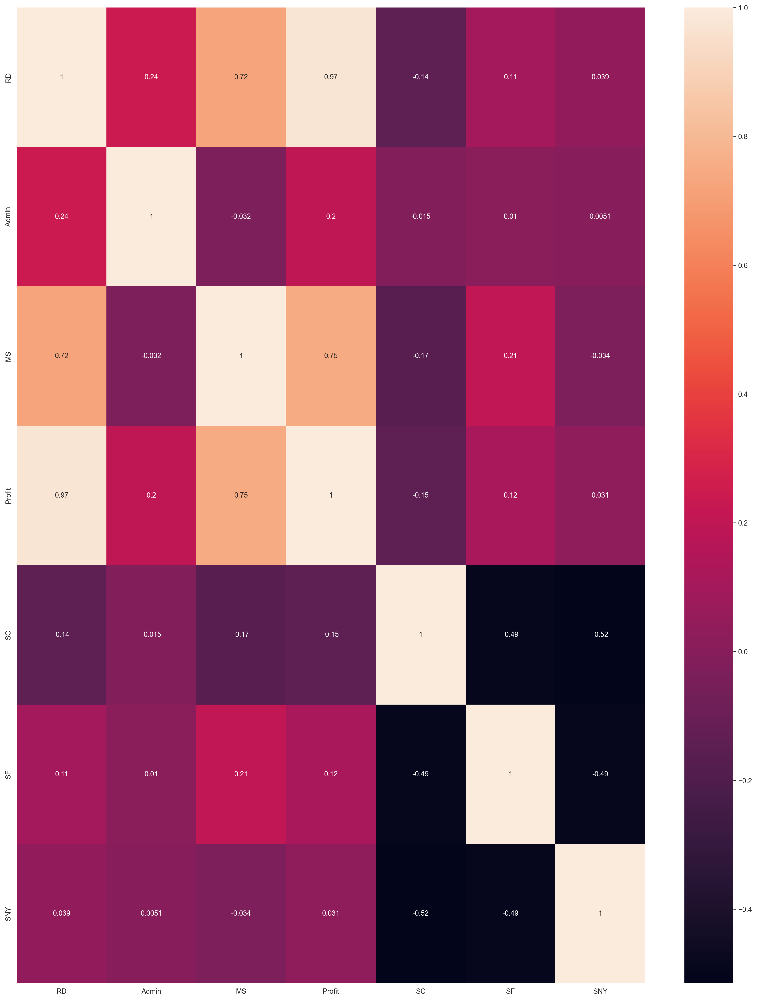

In [30]:
sns.heatmap(scaled_data.corr(), annot = True)

In [31]:
# From above graph we can see that profit is strongly related to RD
# We'll only be considering the features RD, Admin & MS for our analysis

In [32]:
final_data = scaled_data.drop(columns = {'SC', 'SF', 'SNY'})
final_data

,RD,Admin,MS,Profit
0,2.016411,0.560753,2.153943,2.011203
1,1.955860,1.082807,1.923600,1.999430
2,1.754364,-0.728257,1.626528,1.980842
3,1.554784,-0.096365,1.422210,1.776627
4,1.504937,-1.079919,1.281528,1.357740
5,1.279800,-0.776239,1.254210,1.127250
6,1.340066,0.932147,-0.688150,1.105481
7,1.245057,0.871980,0.932186,1.096210
8,1.030369,0.986952,0.830887,1.007470
9,1.091819,-0.456640,0.776107,0.946022


In [33]:
# Model Building

In [34]:
import statsmodels.formula.api as smf

In [35]:
model1 = smf.ols('Profit ~ RD+Admin+MS', data = final_data).fit()

In [36]:
model1.params

Intercept    0.000510
RD           0.916854
Admin       -0.018550
MS           0.082441
dtype: float64

In [37]:
model1.pvalues

Intercept    9.875320e-01
RD           1.918916e-22
Admin        6.003730e-01
MS           1.025052e-01
dtype: float64

In [38]:
model1.rsquared_adj

0.9483056945848496

In [39]:
''' Lets assume alpha = 0.05
The Hypothesis Test for Regression states that
if p < 0.05, reject Null Hypothesis
& p > 0.05, Fail to reject Null Hypothesis
Here the Hypothesis for 2 tail test is
   Ho : m = 0
   Ha :  m != 0
   for Admin and MS Pvalues we see that we fail to reject null hypothesis
   and the column are not important for our analysis
'''

' Lets assume alpha = 0.05\nThe Hypothesis Test for Regression states that\nif p < 0.05, reject Null Hypothesis\n& p > 0.05, Fail to reject Null Hypothesis\nHere the Hypothesis for 2 tail test is\n   Ho : m = 0\n   Ha :  m != 0\n   for Admin and MS Pvalues we see that we fail to reject null hypothesis\n   and the column are not important for our analysis\n'

In [40]:
model2 = smf.ols('Profit ~ RD+MS', data = final_data).fit()

In [41]:
model2.pvalues, model2.rsquared_adj

(Intercept    9.874337e-01
 RD           4.342892e-24
 MS           5.848451e-02
 dtype: float64,
 0.9490995106926059)

In [42]:
model3 = smf.ols('Profit ~ MS', data = final_data).fit()
model3.pvalues, model3.rsquared_adj

(Intercept    9.957716e-01
 MS           4.299398e-10
 dtype: float64,
 0.5503166891598692)

In [43]:
model4 = smf.ols('Profit ~ RD', data = final_data).fit()
model4.pvalues, model4.rsquared_adj

(Intercept    9.877789e-01
 RD           2.509784e-32
 dtype: float64,
 0.9461719156801855)

In [44]:
model5 = smf.ols('Profit ~ RD+Admin', data = final_data).fit()
model5.pvalues, model5.rsquared_adj

(Intercept    9.877596e-01
 RD           1.638746e-31
 Admin        2.866013e-01
 dtype: float64,
 0.9463527102922481)

In [45]:
model6 = smf.ols('Profit ~ MS+Admin', data = final_data).fit()
model6.pvalues, model6.rsquared_adj

(Intercept    9.955529e-01
 MS           9.497175e-11
 Admin        1.715357e-02
 dtype: float64,
 0.5935527635091242)

In [46]:
''' Because there is a Multicolinearity present between MS and RD column,
we need to deal with this issue'''

' Because there is a Multicolinearity present between MS and RD column,\nwe need to deal with this issue'

In [47]:
# Calculating VIF

In [48]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [49]:
final_data.head()

,RD,Admin,MS,Profit
0,2.016411,0.560753,2.153943,2.011203
1,1.955860,1.082807,1.923600,1.999430
2,1.754364,-0.728257,1.626528,1.980842
3,1.554784,-0.096365,1.422210,1.776627
4,1.504937,-1.079919,1.281528,1.357740


In [50]:
vif_data = final_data.iloc[:,0:3]
vif_data

,RD,Admin,MS
0,2.016411,0.560753,2.153943
1,1.955860,1.082807,1.923600
2,1.754364,-0.728257,1.626528
3,1.554784,-0.096365,1.422210
4,1.504937,-1.079919,1.281528
5,1.279800,-0.776239,1.254210
6,1.340066,0.932147,-0.688150
7,1.245057,0.871980,0.932186
8,1.030369,0.986952,0.830887
9,1.091819,-0.456640,0.776107


In [51]:
vif_data.values

array([[ 2.01641149e+00,  5.60752915e-01,  2.15394309e+00],
       [ 1.95586034e+00,  1.08280658e+00,  1.92360040e+00],
       [ 1.75436374e+00, -7.28257028e-01,  1.62652767e+00],
       [ 1.55478369e+00, -9.63646307e-02,  1.42221024e+00],
       [ 1.50493720e+00, -1.07991935e+00,  1.28152771e+00],
       [ 1.27980001e+00, -7.76239071e-01,  1.25421046e+00],
       [ 1.34006641e+00,  9.32147208e-01, -6.88149930e-01],
       [ 1.24505666e+00,  8.71980011e-01,  9.32185978e-01],
       [ 1.03036886e+00,  9.86952101e-01,  8.30886909e-01],
       [ 1.09181921e+00, -4.56640246e-01,  7.76107440e-01],
       [ 6.20398248e-01, -3.87599089e-01,  1.49807267e-01],
       [ 5.93085418e-01, -1.06553960e+00,  3.19833623e-01],
       [ 4.43259872e-01,  2.15449064e-01,  3.20617441e-01],
       [ 4.02077603e-01,  5.10178953e-01,  3.43956788e-01],
       [ 1.01718075e+00,  1.26919939e+00,  3.75742273e-01],
       [ 8.97913123e-01,  4.58678535e-02,  4.19218702e-01],
       [ 9.44411957e-02,  9.11841968e-03

In [52]:
range(len(vif_data.columns))

range(0, 3)

In [53]:
vif = pd.DataFrame()

In [54]:
vif['Features'] = vif_data.columns
vif['Features']

0       RD
1    Admin
2       MS
Name: Features, dtype: object

In [55]:
vif

,Features
0,RD
1,Admin
2,MS


In [56]:
#[] For List Comprehension
vif['VIF_val'] = [variance_inflation_factor(vif_data.values,i) for i in range(len(vif_data.columns))]

In [57]:
vif

,Features,VIF_val
0,RD,2.468903
1,Admin,1.175091
2,MS,2.326773


In [58]:
# Subset Selection
# R2 more AIC less

In [59]:
model6 = smf.ols('Profit ~ Admin+MS', data = final_data).fit()
model6.rsquared_adj, model6.aic

(0.5935527635091242, 100.67131072219242)

In [60]:
model5 = smf.ols('Profit ~ RD+Admin', data = final_data).fit()
model5.rsquared_adj, model5.aic

(0.9463527102922481, -0.5798478408557202)

In [61]:
'''Hence we are not going to consider the MS column because RD and Admin
alone are providing the highest accuracy of model'''

'Hence we are not going to consider the MS column because RD and Admin\nalone are providing the highest accuracy of model'

In [62]:
model5 = smf.ols('Profit ~ RD+Admin', data = final_data).fit()

In [63]:
model5.rsquared_adj

0.9463527102922481

In [64]:
# Model Validation Techniques

model5.resid

0     0.053269
1     0.120058
2     0.232644
3     0.247406
4    -0.158692
5    -0.157184
6    -0.175355
7    -0.093634
8     0.032445
9    -0.142278
10    0.231525
11    0.186750
12    0.313736
13    0.182549
14   -0.435699
15   -0.430919
16    0.282618
17   -0.086272
18   -0.092052
19    0.037722
20    0.096864
21   -0.075889
22   -0.046111
23    0.030288
24   -0.188164
25    0.103614
26   -0.162407
27   -0.132580
28    0.027407
29   -0.059244
30   -0.057524
31   -0.051450
32   -0.132984
33   -0.013011
34    0.253400
35    0.160295
36    0.445805
37   -0.006091
38    0.309430
39   -0.069295
40    0.120106
41    0.082864
42    0.031948
43    0.205257
44   -0.016726
45    0.392998
46   -0.011681
47   -0.131032
48   -0.426080
49   -0.828644
dtype: float64

In [65]:
# Q_Q Plot( Errors are normally distributed or not)
import statsmodels.api as sm

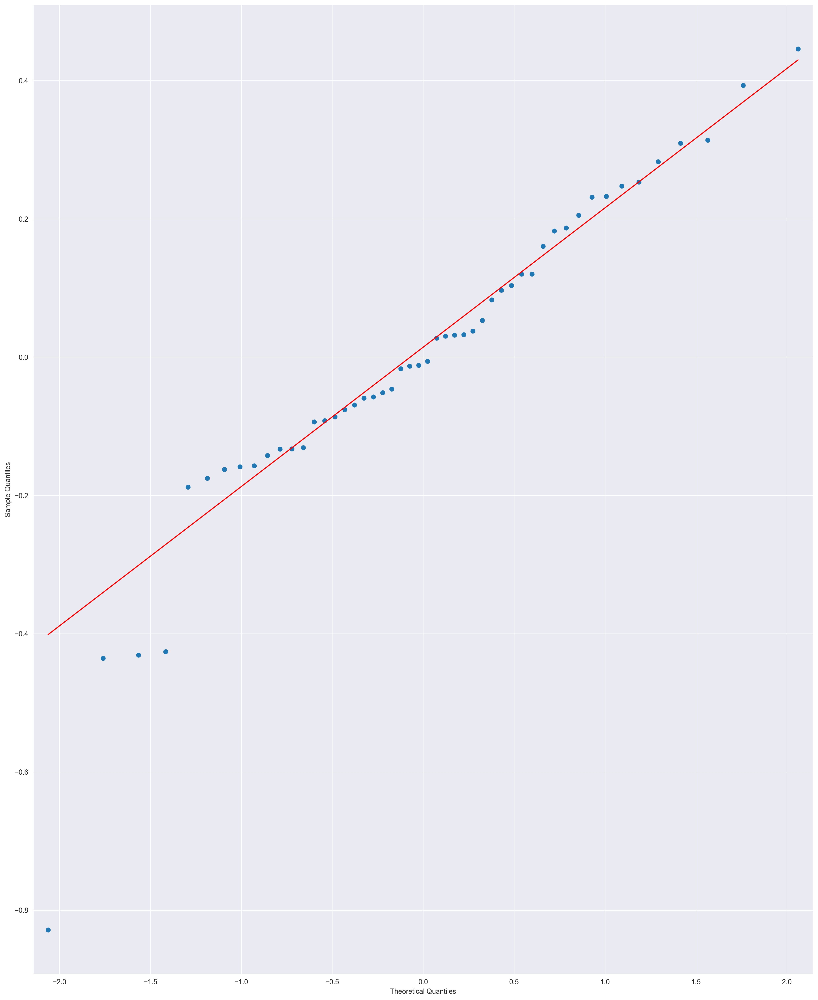

In [66]:
sm.qqplot(model5.resid, line = 'q');

In [67]:
np.argmax(-model5.resid), np.min(model5.resid)

(49, -0.8286438750262242)

In [68]:
# Errors Vs Predicted Values ( No Pattern Should be Present)
model5.fittedvalues

0     1.957935
1     1.879372
2     1.748198
3     1.529222
4     1.516432
5     1.284434
6     1.280836
7     1.189844
8     0.975024
9     1.088300
10    0.623322
11    0.621417
12    0.427419
13    0.376201
14    0.951726
15    0.879639
16    0.092818
17    0.421043
18    0.399168
19    0.232051
20    0.065071
21    0.058355
22    0.004498
23   -0.112458
24    0.101434
25   -0.219107
26    0.005040
27   -0.042962
28   -0.246205
29   -0.216638
30   -0.245101
31   -0.312678
32   -0.232540
33   -0.368776
34   -0.636844
35   -0.549586
36   -0.979737
37   -0.546864
38   -1.080928
39   -0.707798
40   -0.966518
41   -0.940330
42   -1.047313
43   -1.264217
44   -1.156483
45   -1.573081
46   -1.555241
47   -1.609595
48   -1.487132
49   -1.585184
dtype: float64

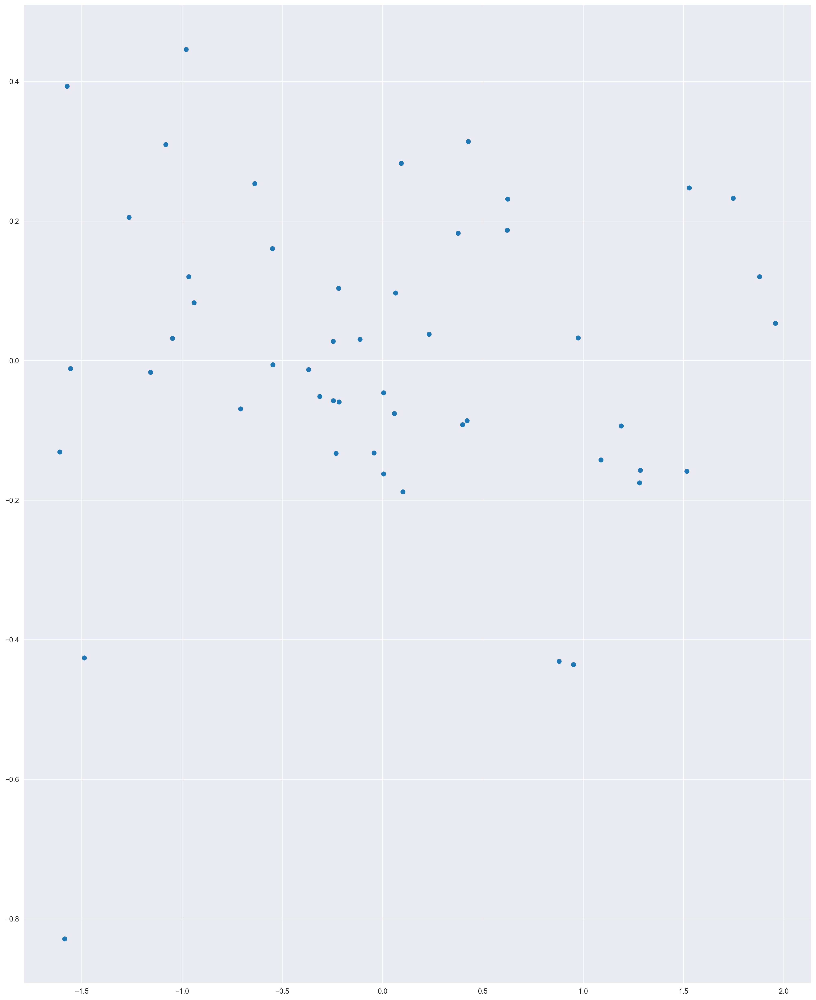

In [69]:
plt.scatter(model5.fittedvalues, model5.resid)

eval_env: 1


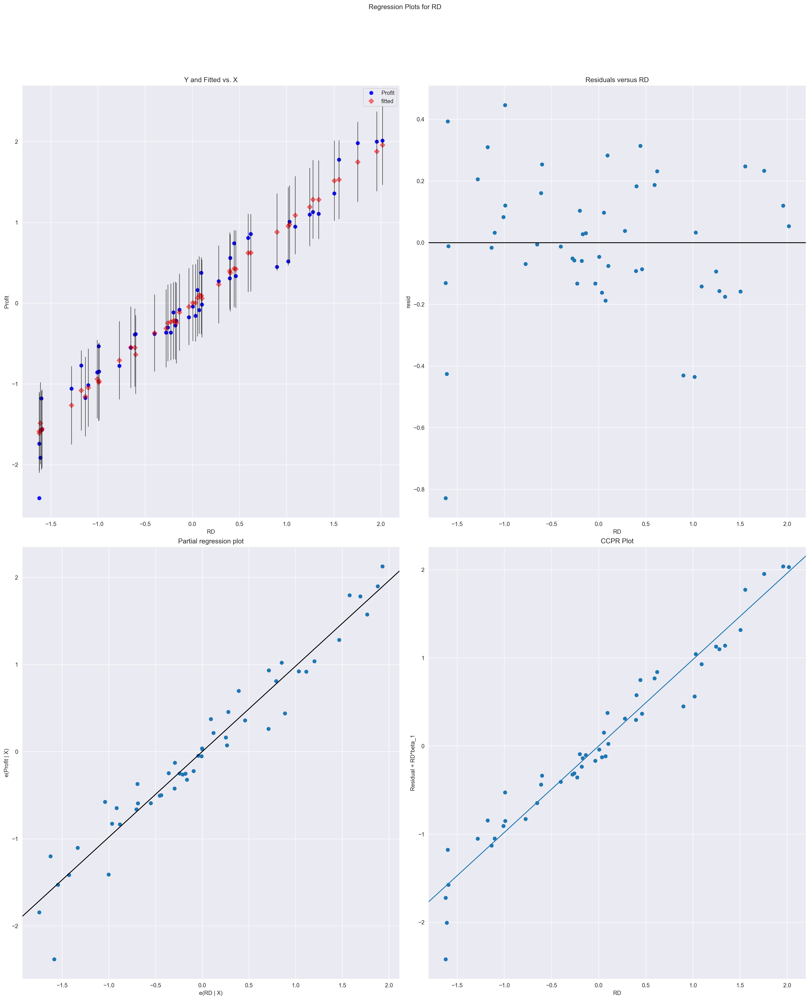

In [70]:
# Errors Vs Regressors/Features
#RD
sm.graphics.plot_regress_exog(model5,'RD');

eval_env: 1


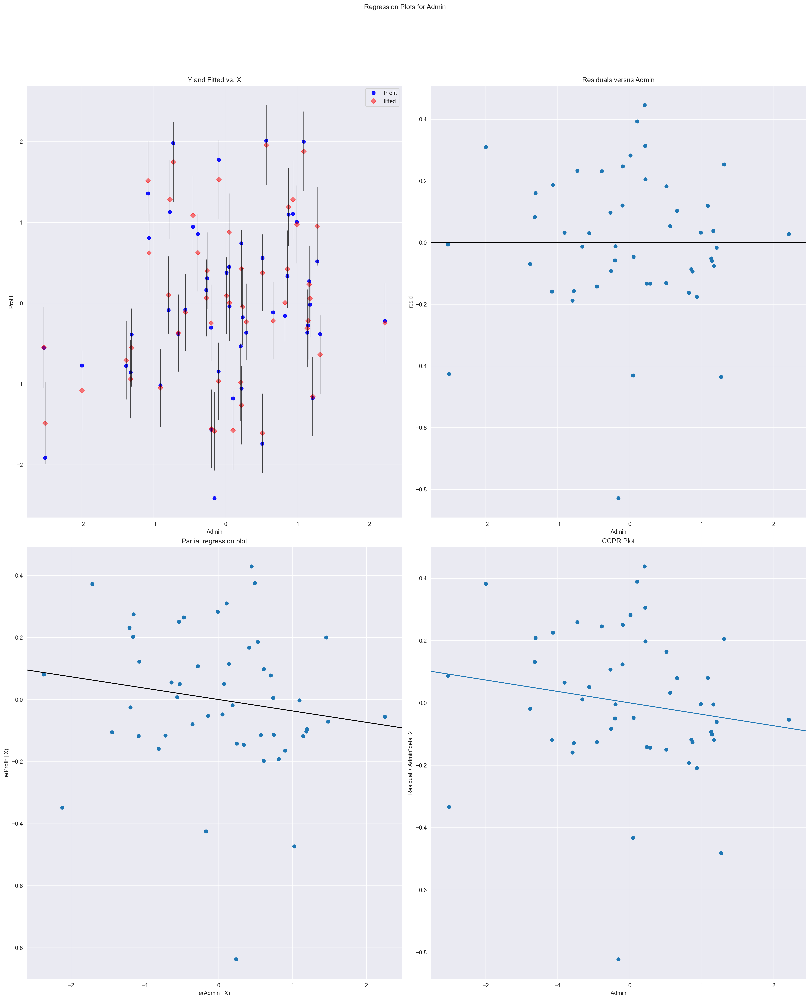

In [71]:
#Admin
sm.graphics.plot_regress_exog(model5,'Admin');

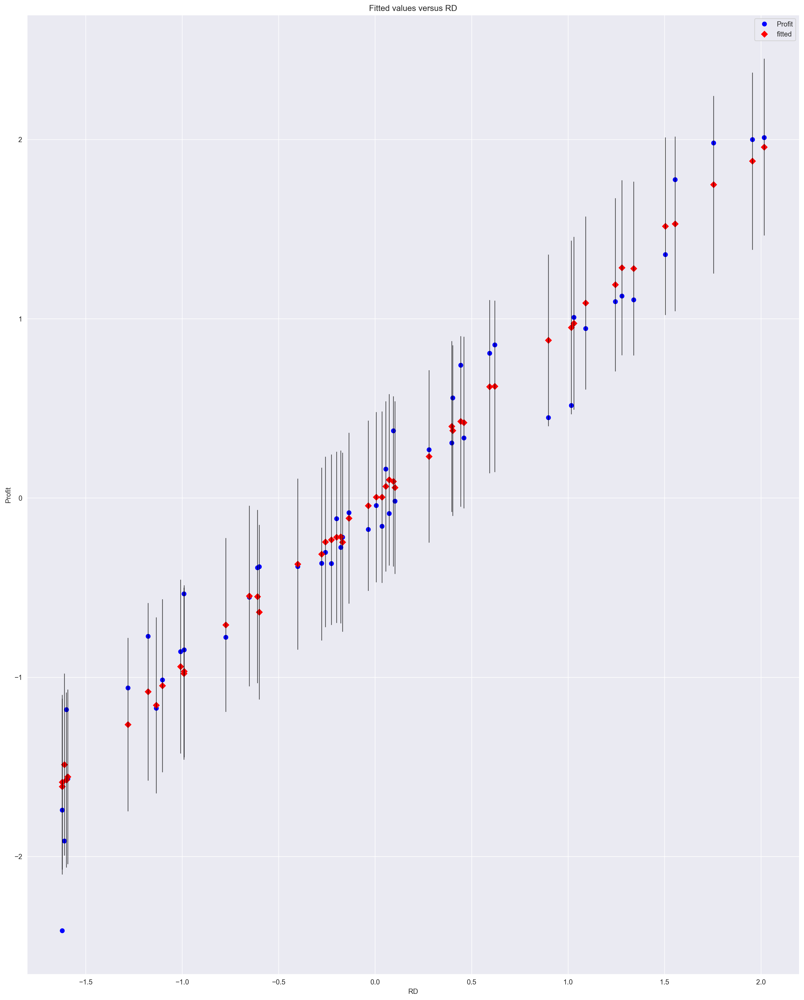

In [72]:
sm.graphics.plot_fit(model5,'RD');

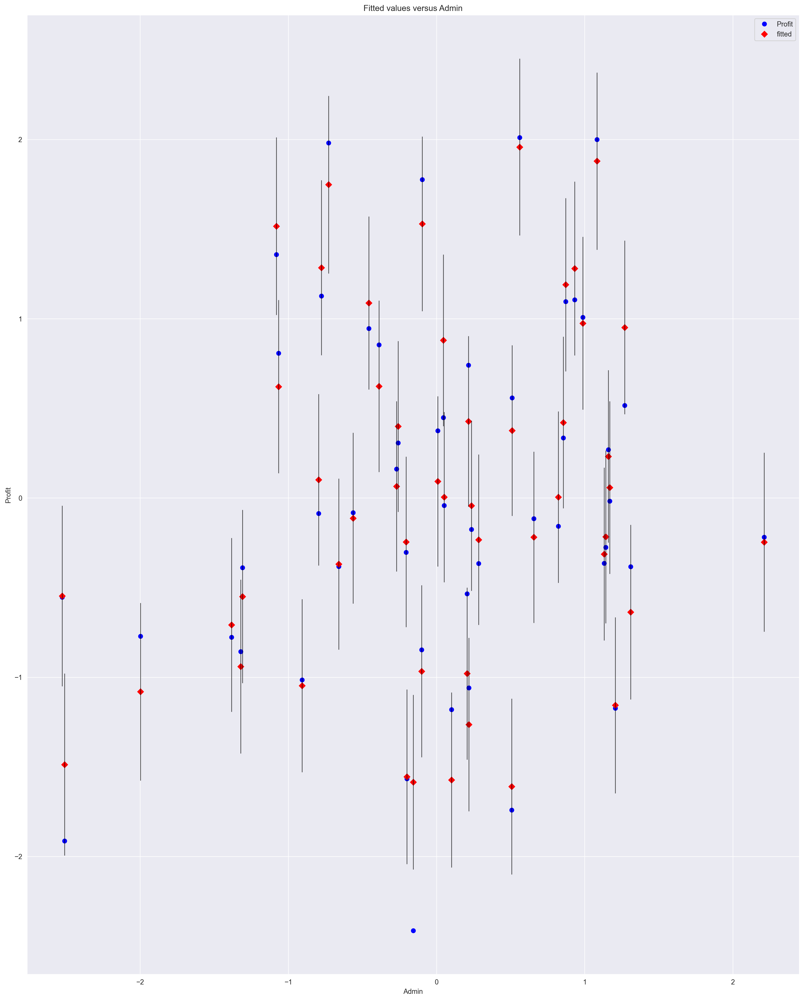

In [73]:
sm.graphics.plot_fit(model5,'Admin');

In [74]:
#Model Deletion Techniques

#Finding out Influence Data Point
inf = model5.get_influence()
# Calculating Cook's Distance
c, p = inf.cooks_distance

In [75]:
c

array([2.17592127e-03, 1.14524335e-02, 4.57684490e-02, 3.17863468e-02,
       2.12499981e-02, 1.37983820e-02, 1.36550311e-02, 3.49286790e-03,
       3.78114194e-04, 7.59164976e-03, 1.18620486e-02, 1.39387736e-02,
       1.52561993e-02, 5.76845334e-03, 8.30447985e-02, 4.48942752e-02,
       1.02497851e-02, 1.76059841e-03, 1.40708471e-03, 4.48495312e-04,
       1.30261116e-03, 1.86315930e-03, 2.71053680e-04, 1.55477720e-04,
       7.91277016e-03, 2.18922076e-03, 5.87961419e-03, 2.38441037e-03,
       7.73511170e-04, 1.20018995e-03, 4.59462874e-04, 9.34956802e-04,
       2.65677322e-03, 3.28738007e-05, 3.28986403e-02, 9.87150713e-03,
       5.82423848e-02, 4.60251892e-05, 8.11759735e-02, 2.07901882e-03,
       3.82119095e-03, 3.11497538e-03, 3.68224773e-04, 1.70510225e-02,
       1.91362152e-04, 8.42982224e-02, 6.90942029e-05, 1.13692092e-02,
       2.67440528e-01, 3.60690504e-01])

<StemContainer object of 3 artists>

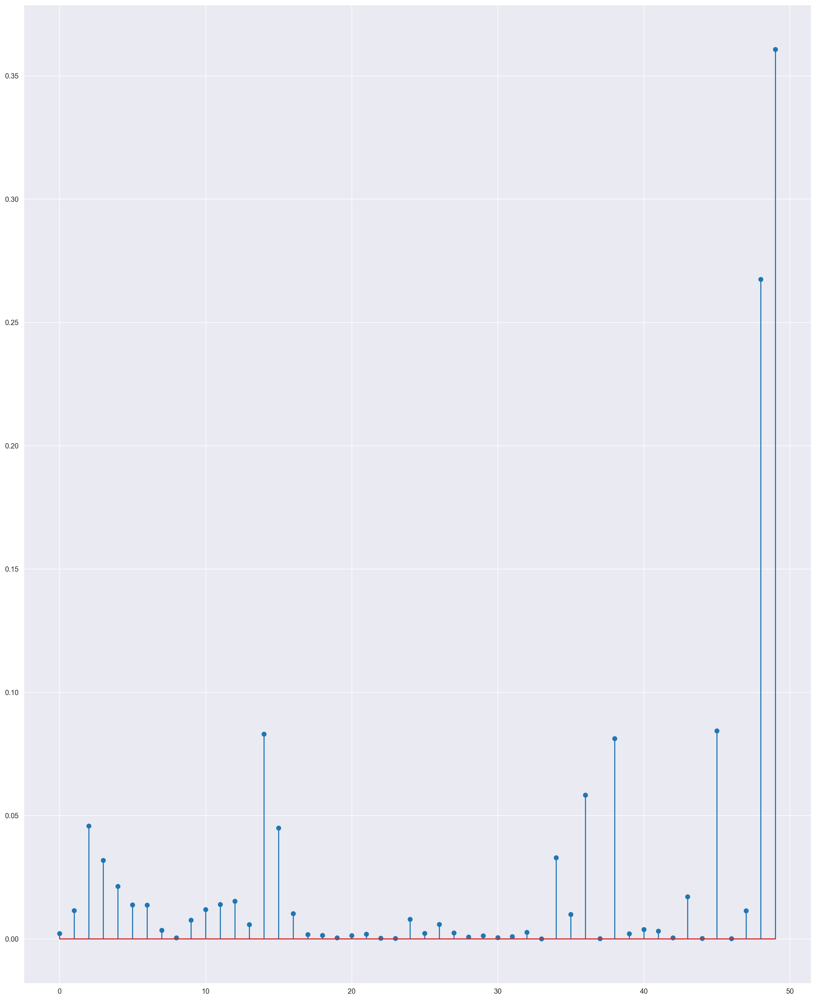

In [76]:
# Ploting Cook's Distance
plt.stem(c)

In [77]:
from statsmodels.graphics.regressionplots import influence_plot

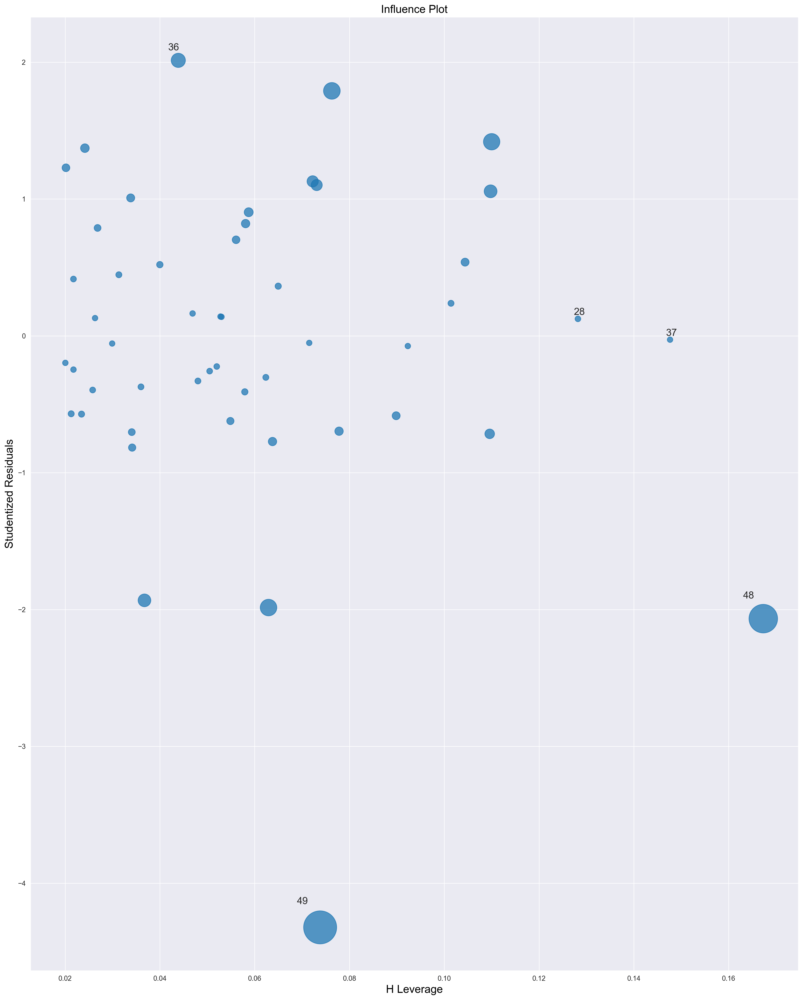

In [78]:
influence_plot(model5);

In [79]:
k = len(final_data.columns)
n = len(final_data)
lv = 3*(k+1)/n
lv

0.3

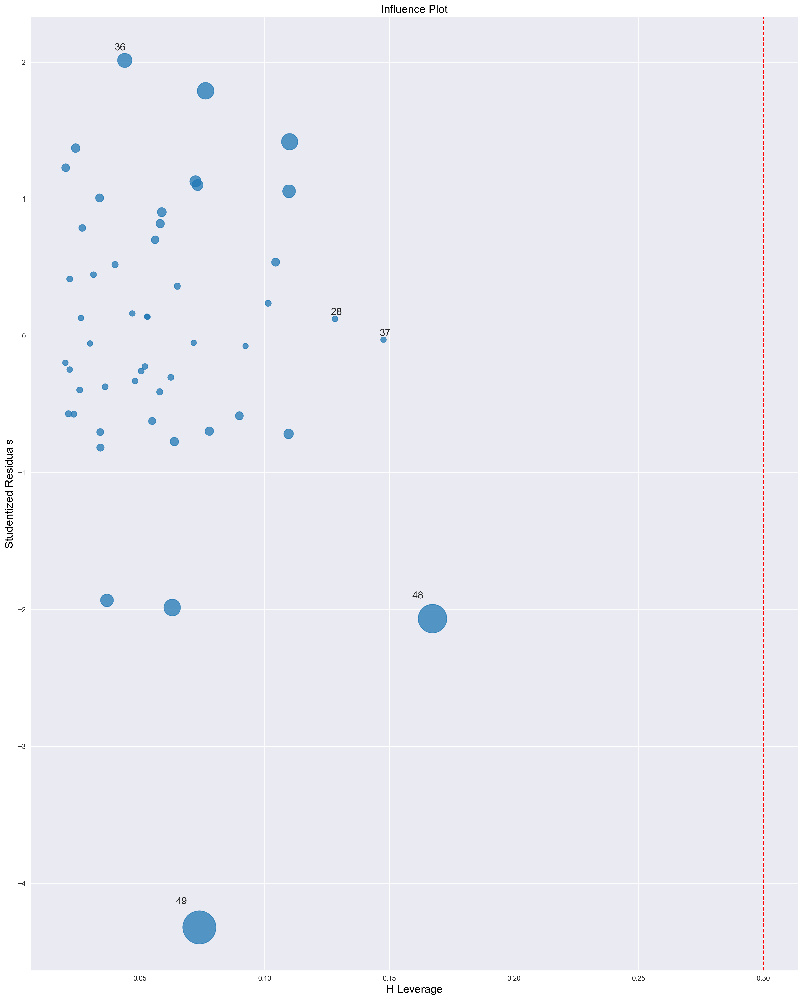

In [80]:
influence_plot(model5);
plt.axvline(lv, linestyle = '--', color = 'red')

In [81]:
final_data.loc[[49]]

,RD,Admin,MS,Profit
49,-1.622362,-0.157226,-1.369985,-2.413828


In [82]:
final_data.tail(10)

,RD,Admin,MS,Profit
40,-0.989577,-0.100900,-0.315786,-0.846411
41,-1.008534,-1.320796,-0.384552,-0.857466
42,-1.102106,-0.906938,-0.520596,-1.015365
43,-1.281134,0.217682,-1.449605,-1.058960
44,-1.134305,1.206419,-1.509074,-1.173209
45,-1.600350,0.101254,-1.727400,-1.180082
46,-1.593413,-0.199322,0.711122,-1.566922
47,-1.622362,0.507722,-1.743127,-1.740627
48,-1.610433,-2.509409,-1.743127,-1.913212
49,-1.622362,-0.157226,-1.369985,-2.413828


In [83]:
'''We can see that there is a data point having error not following normal distribution 
So we will drop the data and rebuild our model and see if the accuracy is improved'''

'We can see that there is a data point having error not following normal distribution \nSo we will drop the data and rebuild our model and see if the accuracy is improved'

In [84]:
test_data = final_data.drop(index = 49)
test_data

,RD,Admin,MS,Profit
0,2.016411,0.560753,2.153943,2.011203
1,1.955860,1.082807,1.923600,1.999430
2,1.754364,-0.728257,1.626528,1.980842
3,1.554784,-0.096365,1.422210,1.776627
4,1.504937,-1.079919,1.281528,1.357740
5,1.279800,-0.776239,1.254210,1.127250
6,1.340066,0.932147,-0.688150,1.105481
7,1.245057,0.871980,0.932186,1.096210
8,1.030369,0.986952,0.830887,1.007470
9,1.091819,-0.456640,0.776107,0.946022


In [85]:
model_test = smf.ols('Profit ~ RD+Admin', data = test_data).fit()

In [86]:
model_test.params, model_test.rsquared_adj, model_test.pvalues

(Intercept    0.018403
 RD           0.950844
 Admin       -0.032239
 dtype: float64,
 0.9566454681867528,
 Intercept    5.212565e-01
 RD           5.451979e-33
 Admin        2.728844e-01
 dtype: float64)

In [87]:
# We can surely see that the models accuracy has improved

In [88]:
model_test.resid

0     0.093586
1     0.156217
2     0.270835
3     0.276761
4    -0.126438
5    -0.133068
6    -0.157066
7    -0.077936
8     0.041164
9    -0.125252
10    0.234046
11    0.191481
12    0.308226
13    0.174481
14   -0.428640
15   -0.421980
16    0.267527
17   -0.094120
18   -0.096843
19    0.023055
20    0.081854
21   -0.095919
22   -0.064056
23    0.010808
24   -0.200298
25    0.076782
26   -0.182911
27   -0.152595
28   -0.005454
29   -0.087626
30   -0.082269
31   -0.082740
32   -0.158981
33   -0.040035
34    0.211557
35    0.129893
36    0.397132
37   -0.032336
38    0.265022
39   -0.104305
40    0.072865
41    0.040508
42   -0.015076
43    0.147812
44   -0.074172
45    0.326462
46   -0.076665
47   -0.200050
48   -0.481245
dtype: float64

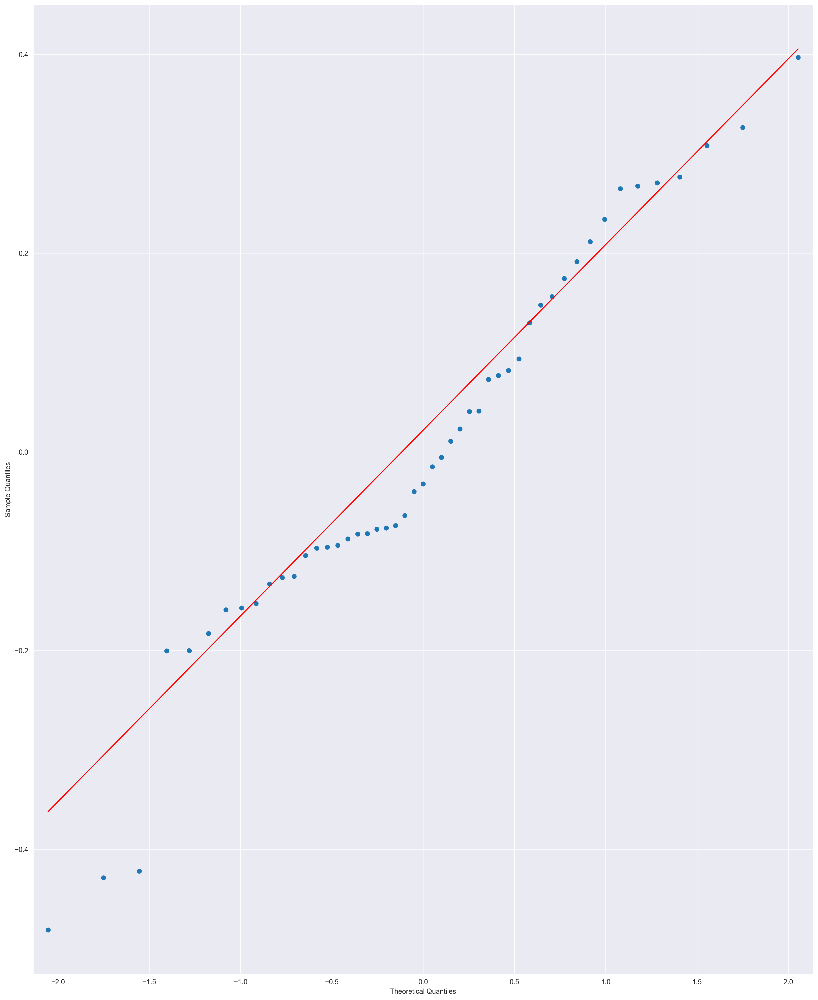

In [89]:
sm.qqplot(model_test.resid, line = 'q');

In [90]:
list(np.where(model_test.resid < -.4))

[array([14, 15, 48], dtype=int64)]

In [91]:
test_data.drop(index = [14, 15, 48], inplace = True)

In [92]:
mod_data = test_data.reset_index()
mod_data.drop(columns = 'index' , inplace = True)

In [93]:
mod_data

,RD,Admin,MS,Profit
0,2.016411,0.560753,2.153943,2.011203
1,1.955860,1.082807,1.923600,1.999430
2,1.754364,-0.728257,1.626528,1.980842
3,1.554784,-0.096365,1.422210,1.776627
4,1.504937,-1.079919,1.281528,1.357740
5,1.279800,-0.776239,1.254210,1.127250
6,1.340066,0.932147,-0.688150,1.105481
7,1.245057,0.871980,0.932186,1.096210
8,1.030369,0.986952,0.830887,1.007470
9,1.091819,-0.456640,0.776107,0.946022


In [94]:
modelfinal = smf.ols('Profit ~ RD+Admin', data = mod_data).fit()

In [95]:
modelfinal.rsquared_adj

0.9688254367920628

In [96]:
modelfinal.resid

0     0.068437
1     0.139914
2     0.224890
3     0.241843
4    -0.177606
5    -0.178609
6    -0.174315
7    -0.095947
8     0.025613
9    -0.164994
10    0.196649
11    0.142866
12    0.281319
13    0.152585
14    0.238070
15   -0.110412
16   -0.131523
17    0.012287
18    0.047854
19   -0.106083
20   -0.092578
21   -0.027577
22   -0.243098
23    0.058848
24   -0.198689
25   -0.177961
26    0.002402
27   -0.097522
28   -0.114408
29   -0.092584
30   -0.183049
31   -0.079365
32    0.205530
33    0.080281
34    0.373705
35   -0.102108
36    0.205384
37   -0.154740
38    0.044325
39   -0.008294
40   -0.056751
41    0.125316
42   -0.080579
43    0.302837
44   -0.105312
45   -0.216851
dtype: float64

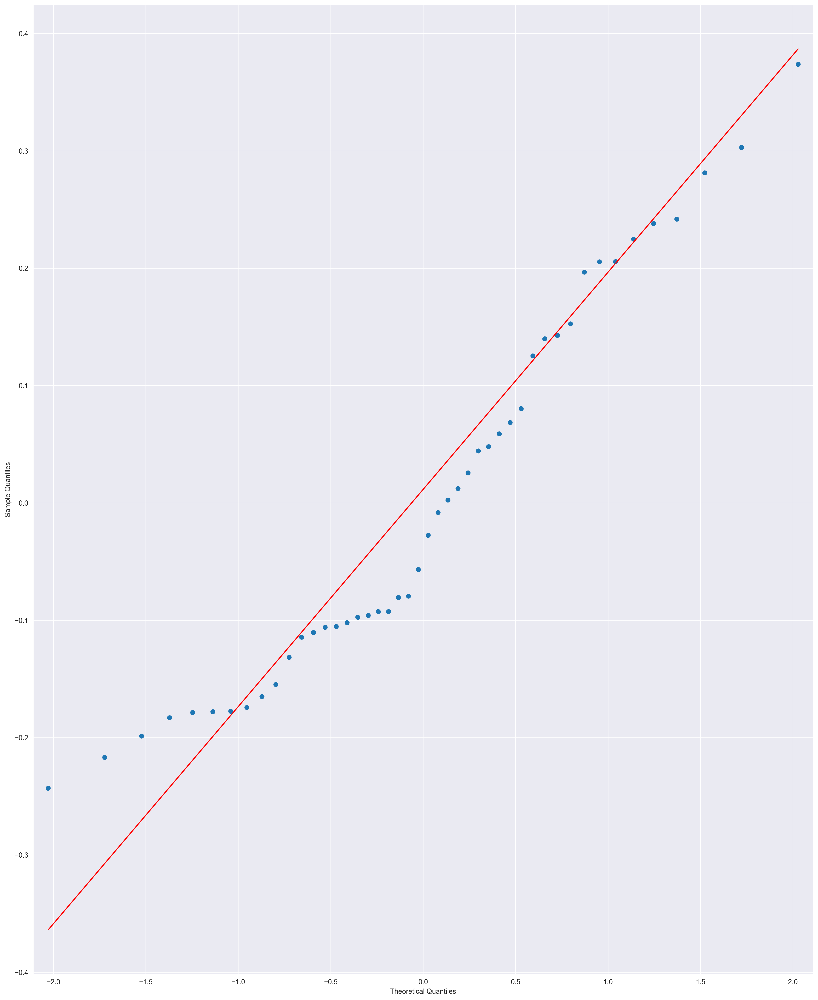

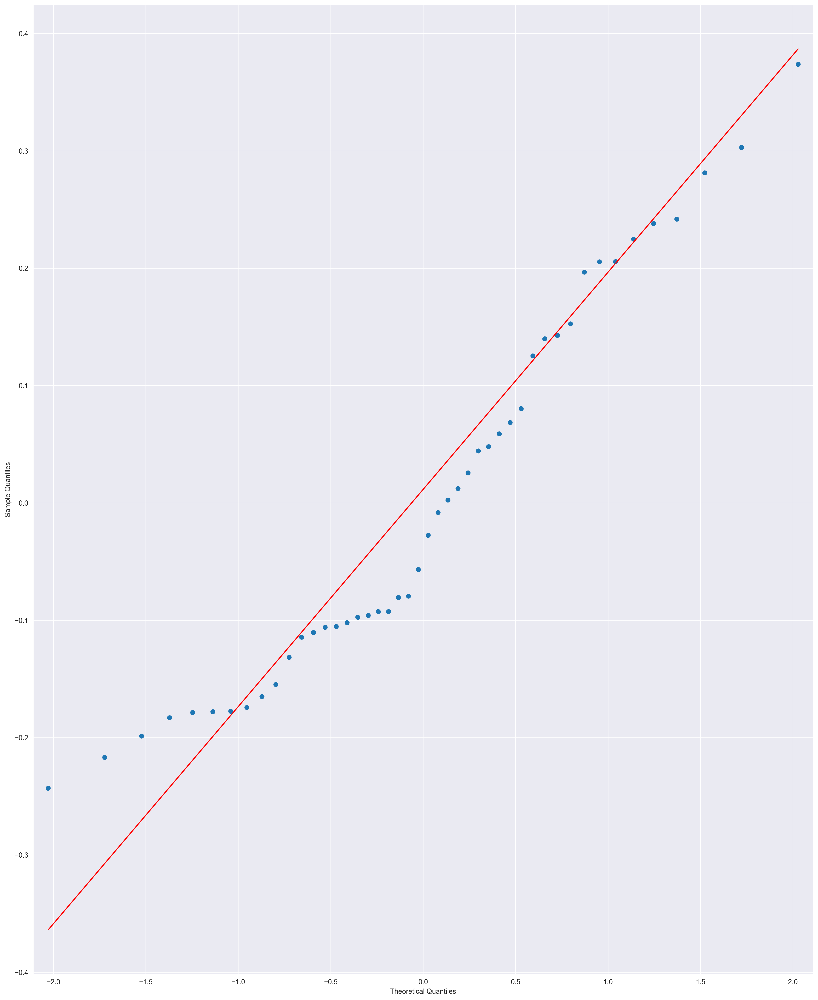

In [97]:
sm.qqplot(modelfinal.resid, line ='q')

In [98]:
#Hence we can say that our Model is Performing Good

In [99]:
modelf = pd.DataFrame()

In [100]:
modelf['models'] = ['model1', 'model2', 'model3','model4','model5', 'model6', 'modelfinal']
modelf['models']

0        model1
1        model2
2        model3
3        model4
4        model5
5        model6
6    modelfinal
Name: models, dtype: object

In [101]:
modelf

,models
0,model1
1,model2
2,model3
3,model4
4,model5
5,model6
6,modelfinal


In [102]:
modelf['R^2'] = [model1.rsquared_adj, model2.rsquared_adj, model3.rsquared_adj, model4.rsquared_adj, model5.rsquared_adj, model6.rsquared_adj, modelfinal.rsquared_adj]

In [103]:
modelf

,models,R^2
0,model1,0.948306
1,model2,0.949100
2,model3,0.550317
3,model4,0.946172
4,model5,0.946353
5,model6,0.593553
6,modelfinal,0.968825


In [104]:
modelf['Reg'] = ['Profit ~ RD+Admin+MS', 'Profit ~ RD+MS', 'Profit ~ MS', 'Profit ~ RD', 'Profit ~ RD+Admin', 'Profit ~ MS+Admin', 'Profit ~ RD+Admin(after data processing)' ]

In [105]:
modelf

,models,R^2,Reg
0,model1,0.948306,Profit ~ RD+Admin+MS
1,model2,0.949100,Profit ~ RD+MS
2,model3,0.550317,Profit ~ MS
3,model4,0.946172,Profit ~ RD
4,model5,0.946353,Profit ~ RD+Admin
5,model6,0.593553,Profit ~ MS+Admin
6,modelfinal,0.968825,Profit ~ RD+Admin(after data processing)


In [106]:
# Predicting New Values

In [107]:
final_data.head()

,RD,Admin,MS,Profit
0,2.016411,0.560753,2.153943,2.011203
1,1.955860,1.082807,1.923600,1.999430
2,1.754364,-0.728257,1.626528,1.980842
3,1.554784,-0.096365,1.422210,1.776627
4,1.504937,-1.079919,1.281528,1.357740


In [108]:
test = pd.DataFrame({ 'RD' : [2.4,1.3, 1.7,2.4,1.3],
                     'Admin': [-.43, -.28, 1.04, -.005, -1.034]})

In [109]:
test

,RD,Admin
0,2.4,-0.430
1,1.3,-0.280
2,1.7,1.040
3,2.4,-0.005
4,1.3,-1.034


In [110]:
model_test.predict(test)

0    2.314291
1    1.263527
2    1.601310
3    2.300589
4    1.287835
dtype: float64

In [111]:
#----------------------------------------------------------------------------------------------------------------------

In [112]:
# Q2
df = pd.read_csv(r'C:\Users\ahmed\OneDrive\Documents\ToyotaCorollaextracted.csv')
df
# EDA

,Price,Age_08_04,KM,HP,cc,Doors,Gears,Quarterly_Tax,Weight
0,13500,23,46986,90,2000,3,5,210,1165
1,13750,23,72937,90,2000,3,5,210,1165
2,13950,24,41711,90,2000,3,5,210,1165
3,14950,26,48000,90,2000,3,5,210,1165
4,13750,30,38500,90,2000,3,5,210,1170
...,...,...,...,...,...,...,...,...,...
1431,7500,69,20544,86,1300,3,5,69,1025
1432,10845,72,19000,86,1300,3,5,69,1015
1433,8500,71,17016,86,1300,3,5,69,1015
1434,7250,70,16916,86,1300,3,5,69,1015


In [113]:
df.describe()

,Price,Age_08_04,KM,HP,cc,Doors,Gears,Quarterly_Tax,Weight
count,1436.000000,1436.000000,1436.000000,1436.000000,1436.00000,1436.000000,1436.000000,1436.000000,1436.00000
mean,10730.824513,55.947075,68533.259749,101.502089,1576.85585,4.033426,5.026462,87.122563,1072.45961
std,3626.964585,18.599988,37506.448872,14.981080,424.38677,0.952677,0.188510,41.128611,52.64112
min,4350.000000,1.000000,1.000000,69.000000,1300.00000,2.000000,3.000000,19.000000,1000.00000
25%,8450.000000,44.000000,43000.000000,90.000000,1400.00000,3.000000,5.000000,69.000000,1040.00000
50%,9900.000000,61.000000,63389.500000,110.000000,1600.00000,4.000000,5.000000,85.000000,1070.00000
75%,11950.000000,70.000000,87020.750000,110.000000,1600.00000,5.000000,5.000000,85.000000,1085.00000
max,32500.000000,80.000000,243000.000000,192.000000,16000.00000,5.000000,6.000000,283.000000,1615.00000


In [114]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1436 entries, 0 to 1435
Data columns (total 9 columns):
 #   Column         Non-Null Count  Dtype
---  ------         --------------  -----
 0   Price          1436 non-null   int64
 1   Age_08_04      1436 non-null   int64
 2   KM             1436 non-null   int64
 3   HP             1436 non-null   int64
 4   cc             1436 non-null   int64
 5   Doors          1436 non-null   int64
 6   Gears          1436 non-null   int64
 7   Quarterly_Tax  1436 non-null   int64
 8   Weight         1436 non-null   int64
dtypes: int64(9)
memory usage: 101.1 KB


In [115]:
df.duplicated().sum()

1

In [116]:
df[df.duplicated(keep = False)]

,Price,Age_08_04,KM,HP,cc,Doors,Gears,Quarterly_Tax,Weight
112,24950,8,13253,116,2000,5,5,234,1320
113,24950,8,13253,116,2000,5,5,234,1320


In [117]:
df.drop_duplicates(inplace = True)

In [118]:
df.duplicated().sum(), df.shape

(0, (1435, 9))

In [119]:
df.reset_index(inplace = True)

In [120]:
df.drop(columns = ['index'], inplace = True)

In [121]:
df

,Price,Age_08_04,KM,HP,cc,Doors,Gears,Quarterly_Tax,Weight
0,13500,23,46986,90,2000,3,5,210,1165
1,13750,23,72937,90,2000,3,5,210,1165
2,13950,24,41711,90,2000,3,5,210,1165
3,14950,26,48000,90,2000,3,5,210,1165
4,13750,30,38500,90,2000,3,5,210,1170
...,...,...,...,...,...,...,...,...,...
1430,7500,69,20544,86,1300,3,5,69,1025
1431,10845,72,19000,86,1300,3,5,69,1015
1432,8500,71,17016,86,1300,3,5,69,1015
1433,7250,70,16916,86,1300,3,5,69,1015


In [122]:
#Renaming Column
df.rename(columns = {'Age_08_04' : 'age', 'Quarterly_Tax' : 'QT', 'Weight' : 'wgt'}, inplace = True)
df

,Price,age,KM,HP,cc,Doors,Gears,QT,wgt
0,13500,23,46986,90,2000,3,5,210,1165
1,13750,23,72937,90,2000,3,5,210,1165
2,13950,24,41711,90,2000,3,5,210,1165
3,14950,26,48000,90,2000,3,5,210,1165
4,13750,30,38500,90,2000,3,5,210,1170
...,...,...,...,...,...,...,...,...,...
1430,7500,69,20544,86,1300,3,5,69,1025
1431,10845,72,19000,86,1300,3,5,69,1015
1432,8500,71,17016,86,1300,3,5,69,1015
1433,7250,70,16916,86,1300,3,5,69,1015


<Axes: >

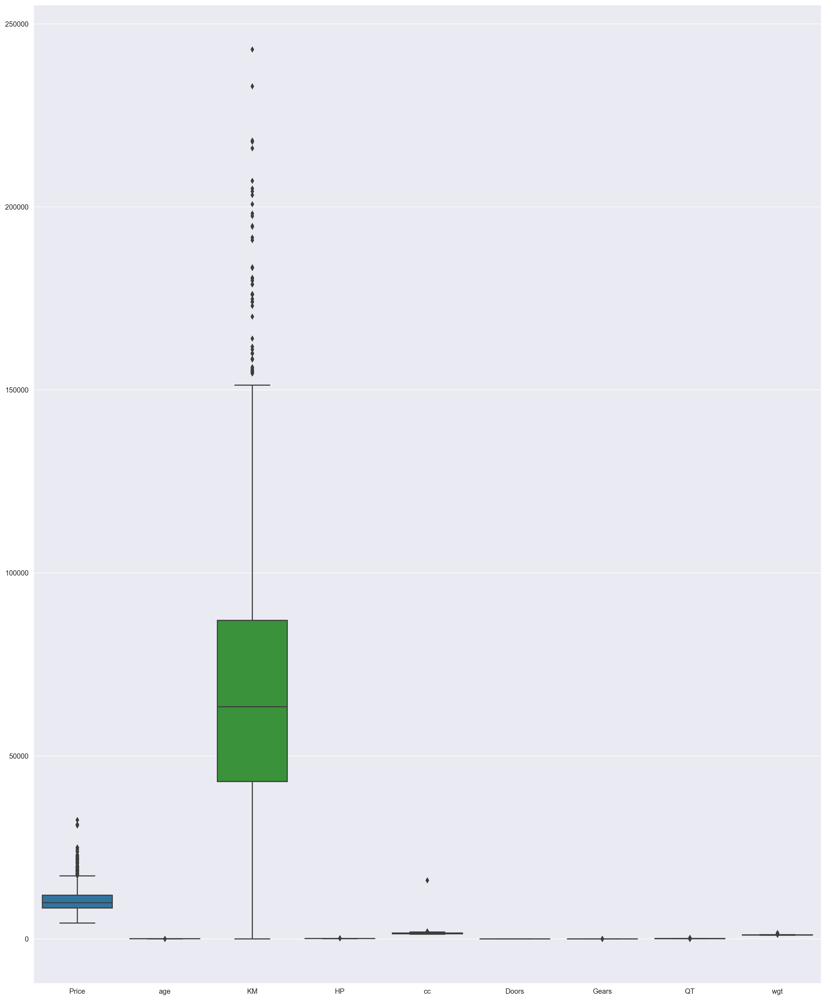

In [123]:
sns.boxplot(df)

In [124]:
# The Data has numerous Outliers present in the columns

In [125]:
# Outlier Detection and Capping

In [126]:
def outlier_detection (data, colname):
    q1 = data[colname].quantile(0.25)
    q3 = data[colname].quantile(0.75)
    iqr = q3-q1
    lower = q1 - (1.5 * iqr)
    upper = q1 + (1.5 * iqr)
    return lower, upper

In [127]:
l, u = outlier_detection(df, 'Price')
l,u

(3200.0, 13700.0)

In [128]:
df.loc[df['Price'] > u, 'Price']

1      13750
2      13950
3      14950
4      13750
6      16900
       ...  
467    13950
511    13950
522    18950
528    13750
556    13750
Name: Price, Length: 211, dtype: int64

<Axes: >

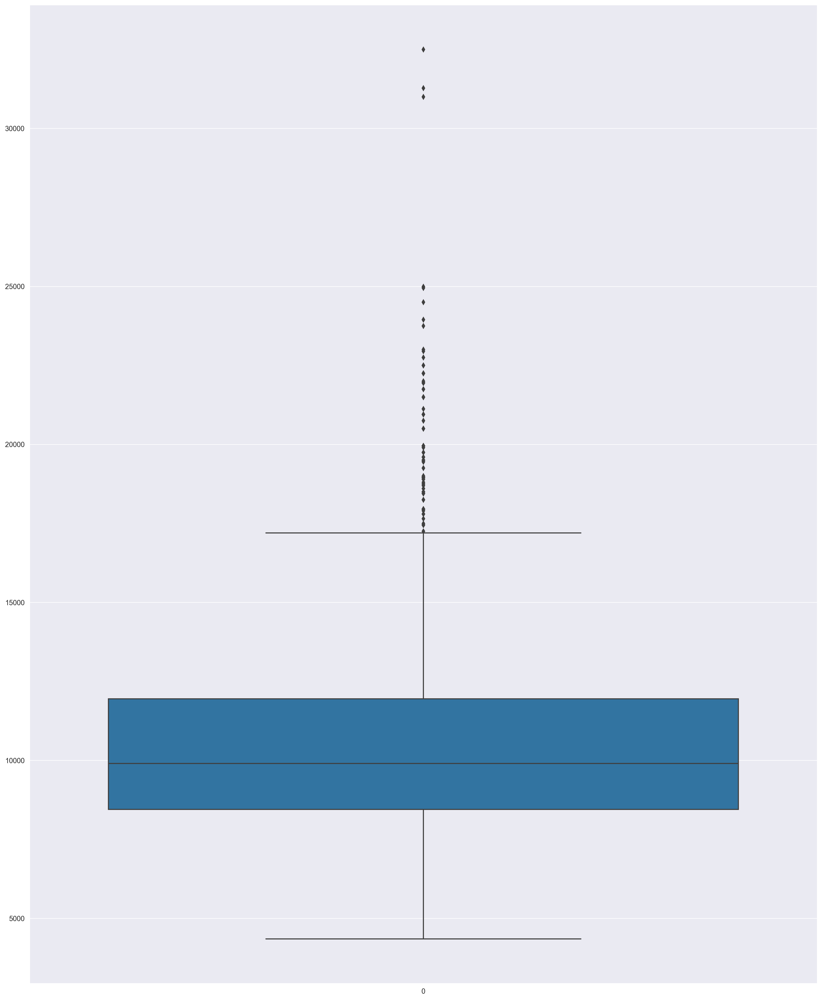

In [129]:
sns.boxplot(df['Price'])

In [130]:
df.loc[df['Price'] < l, 'Price'].count()

0

In [131]:
df.loc[df['Price'] > u, 'Price'] = u

<Axes: >

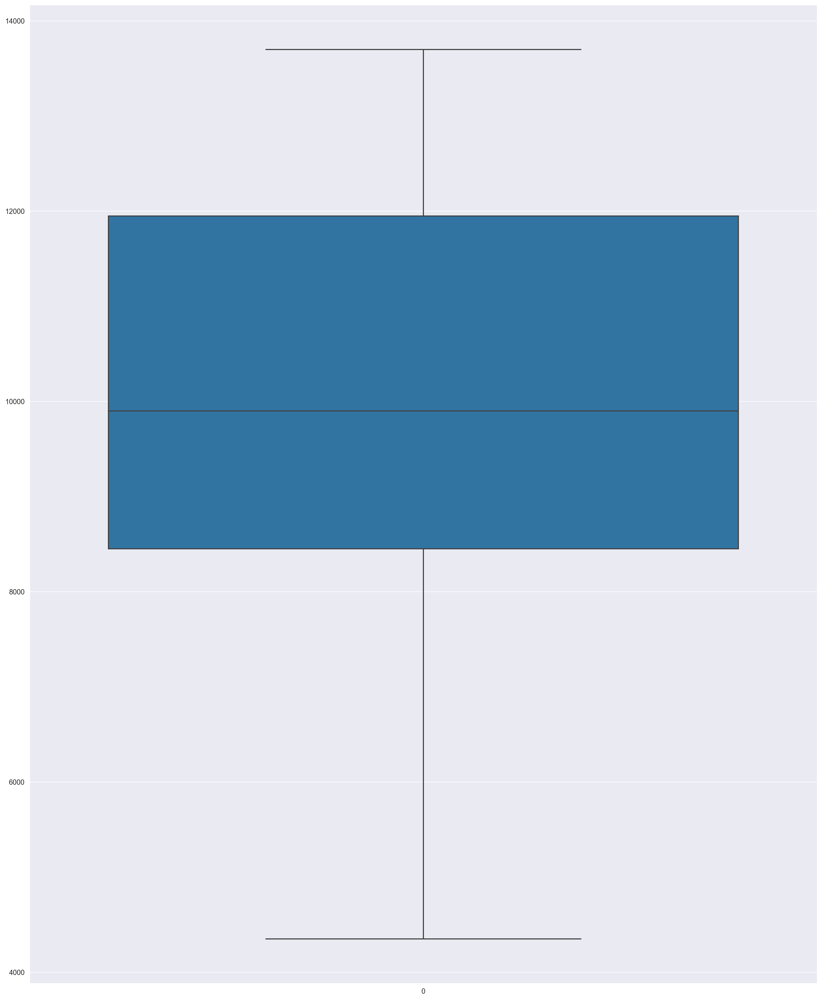

In [132]:
sns.boxplot(df['Price'])

In [133]:
#We are going to repeat this process for every column containing Outliers
l, u = outlier_detection(df, 'age')
l,u

(5.0, 83.0)

In [134]:
df.loc[df['age'] > u, 'age'] = u

In [135]:
df.loc[df['age'] < l, 'age'] = l

<Axes: >

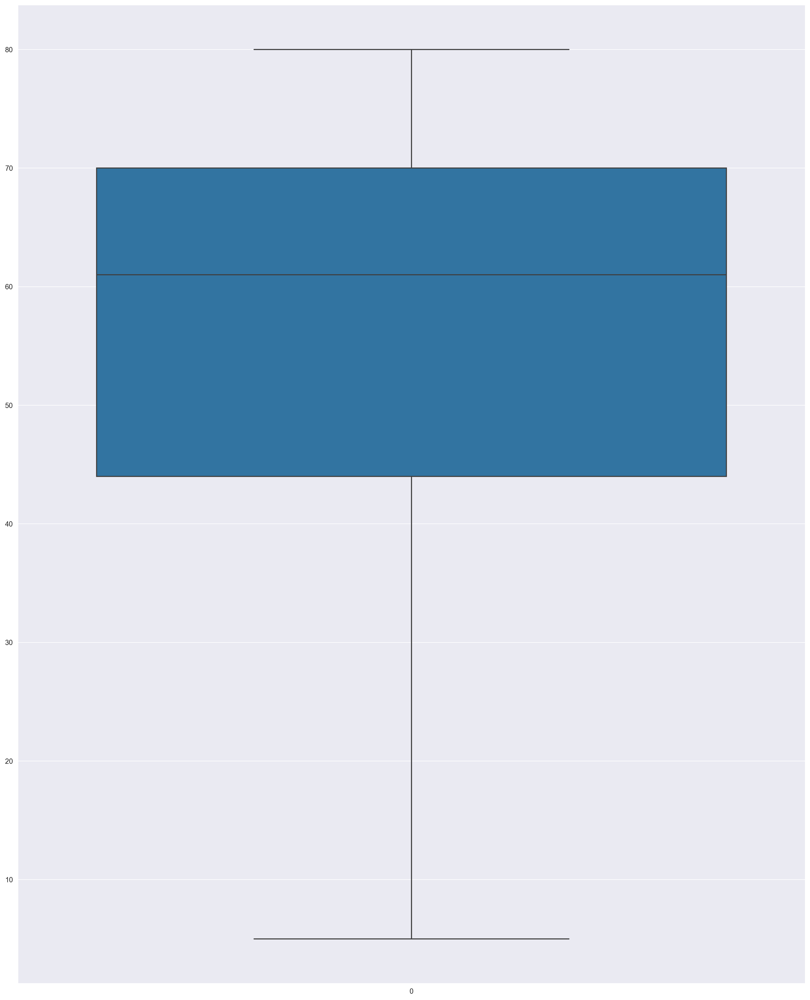

In [136]:
sns.boxplot(df['age'])

In [137]:
def outlier_removal(data, colname):
    l, u = outlier_detection(data, colname)
    data.loc[data[colname] > u, colname] = u
    data.loc[data[colname] < l, colname] = l
    return sns.boxplot(data[colname])

<Axes: >

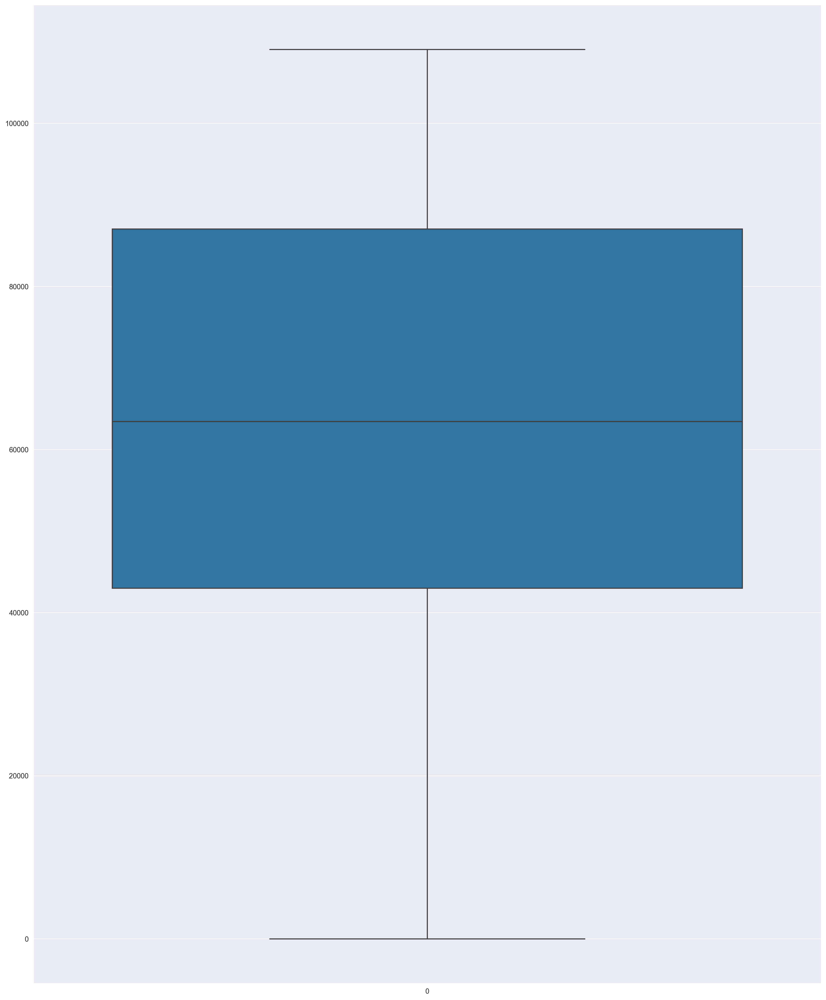

In [138]:
outlier_removal(df,'KM')

<Axes: >

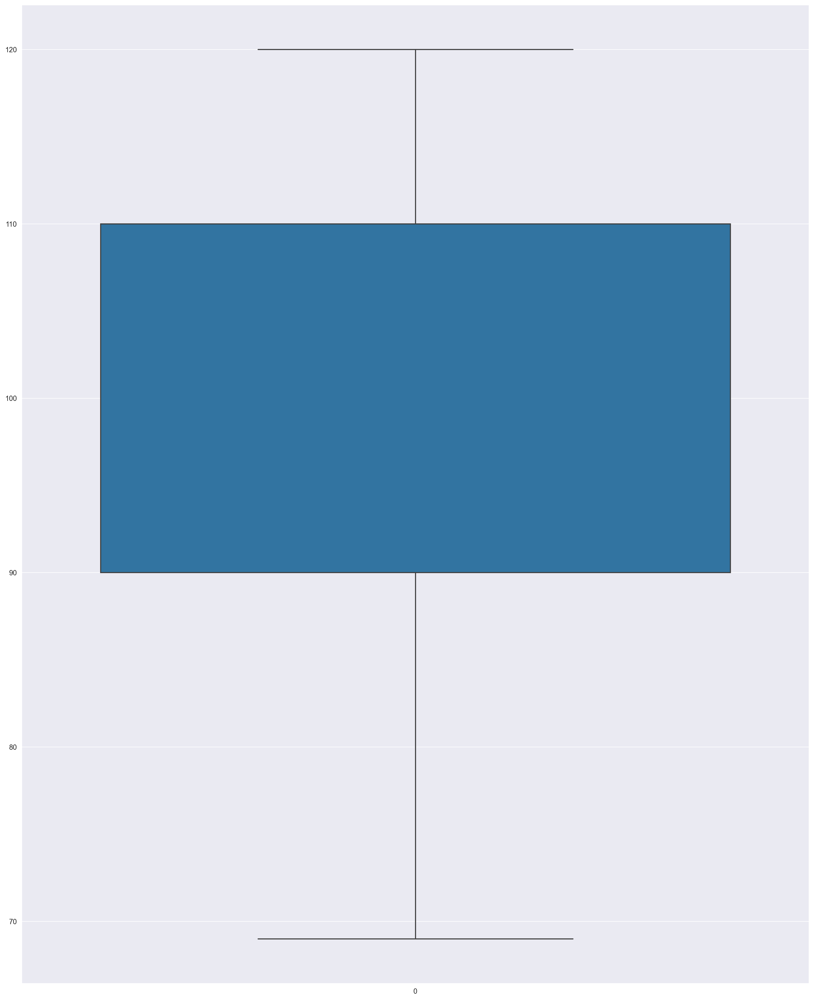

In [139]:
outlier_removal(df,'HP')

<Axes: >

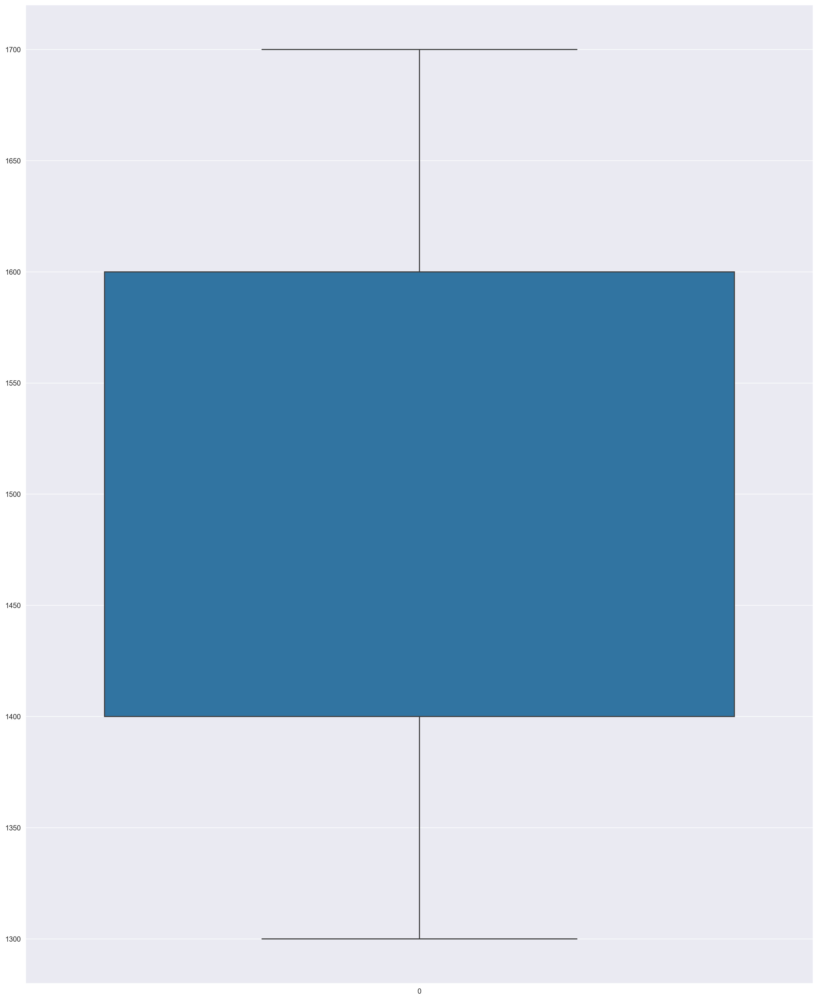

In [140]:
outlier_removal(df,'cc')

<Axes: >

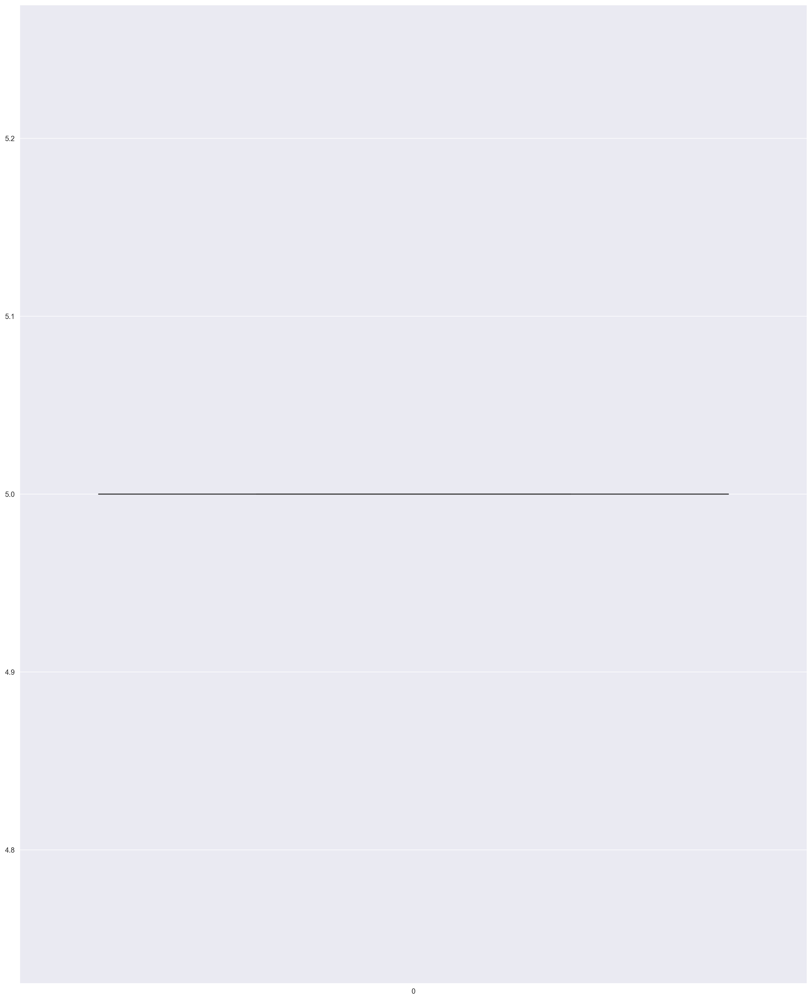

In [141]:
outlier_removal(df,'Gears')

In [142]:
df['Gears'].unique()

array([5], dtype=int64)

<Axes: >

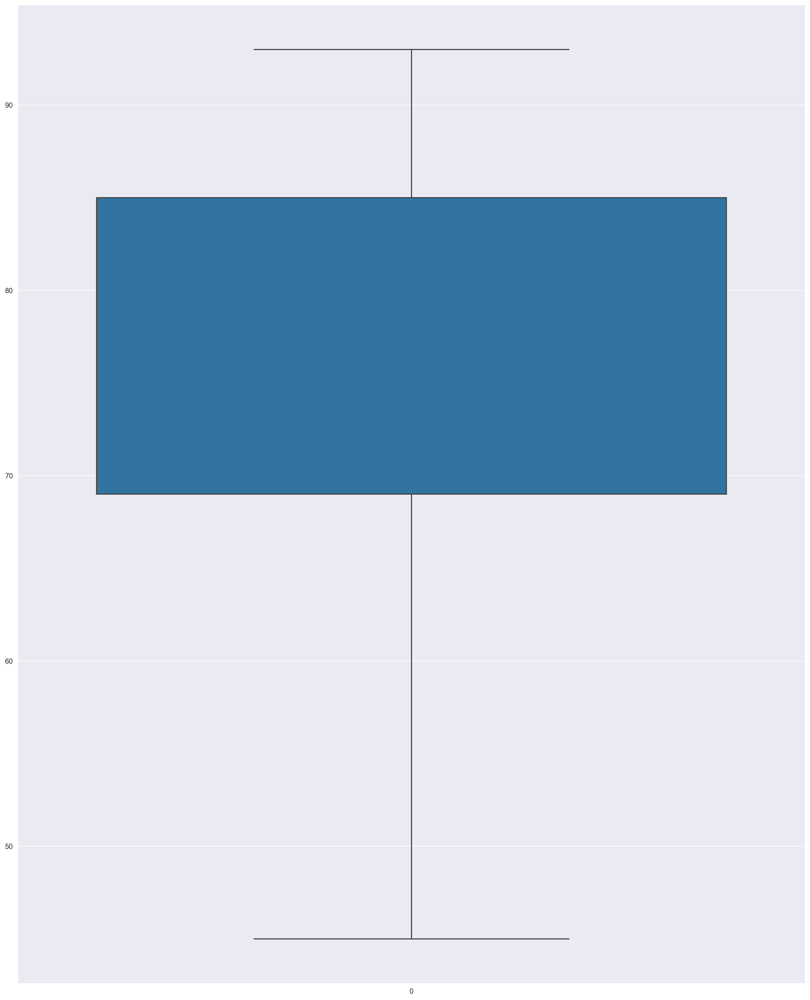

In [143]:
outlier_removal(df,'QT')

<Axes: >

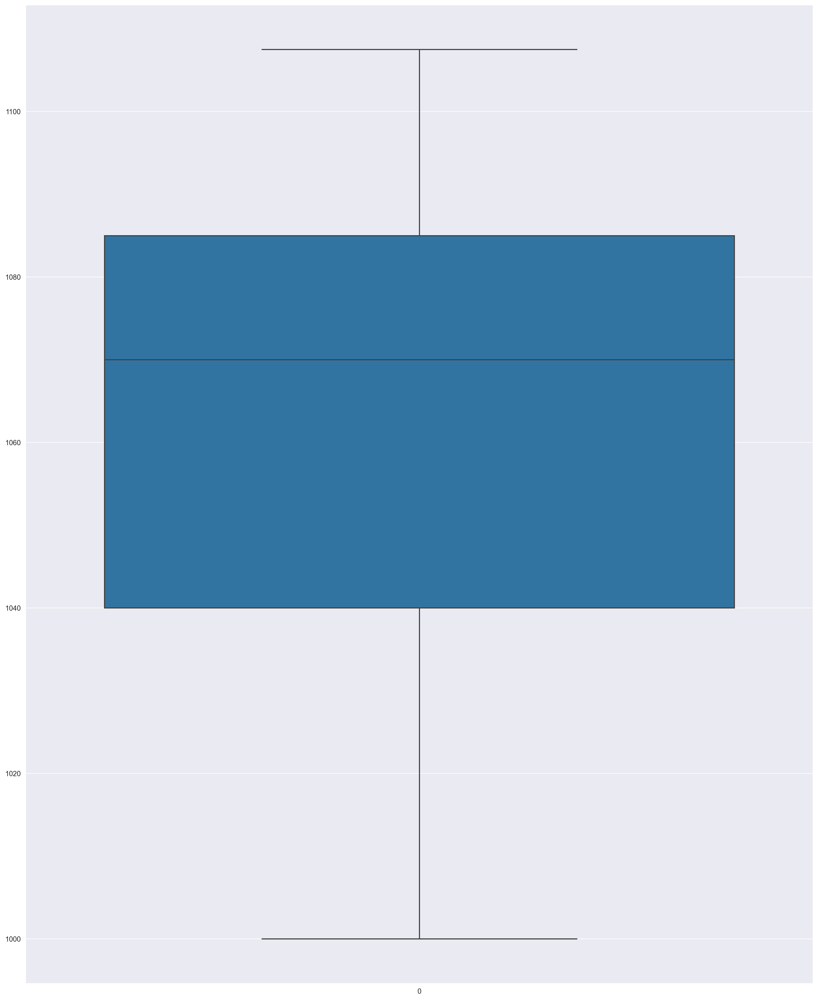

In [144]:
outlier_removal(df,'wgt')

<Axes: >

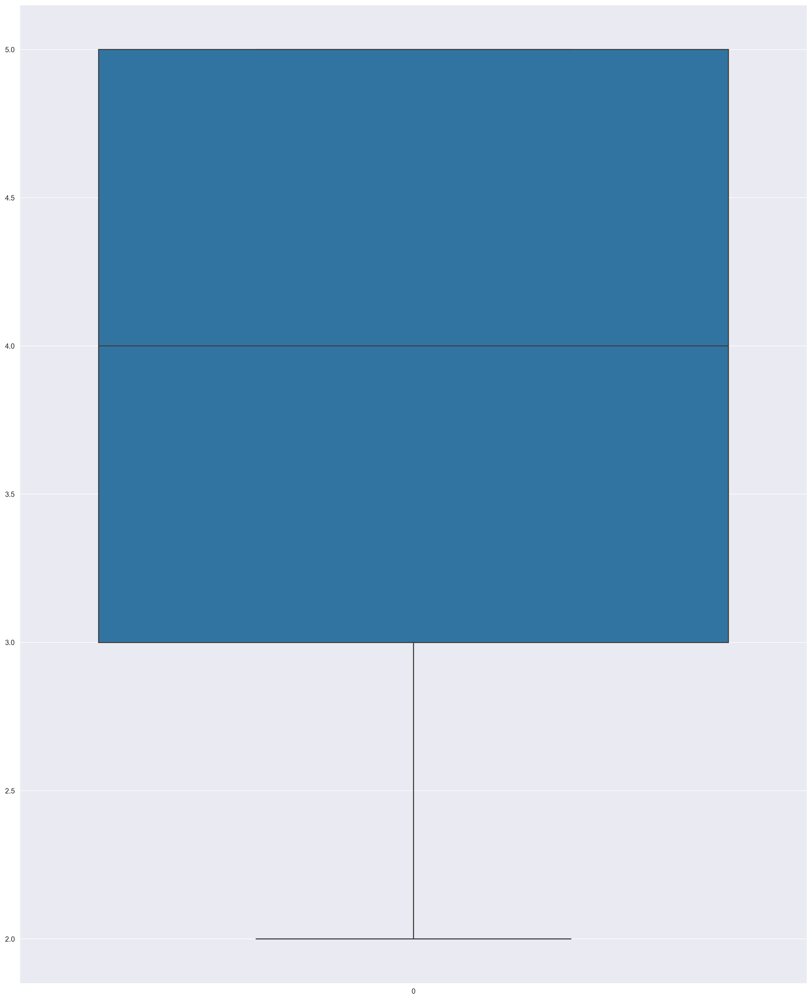

In [145]:
sns.boxplot(df['Doors'])

<Axes: >

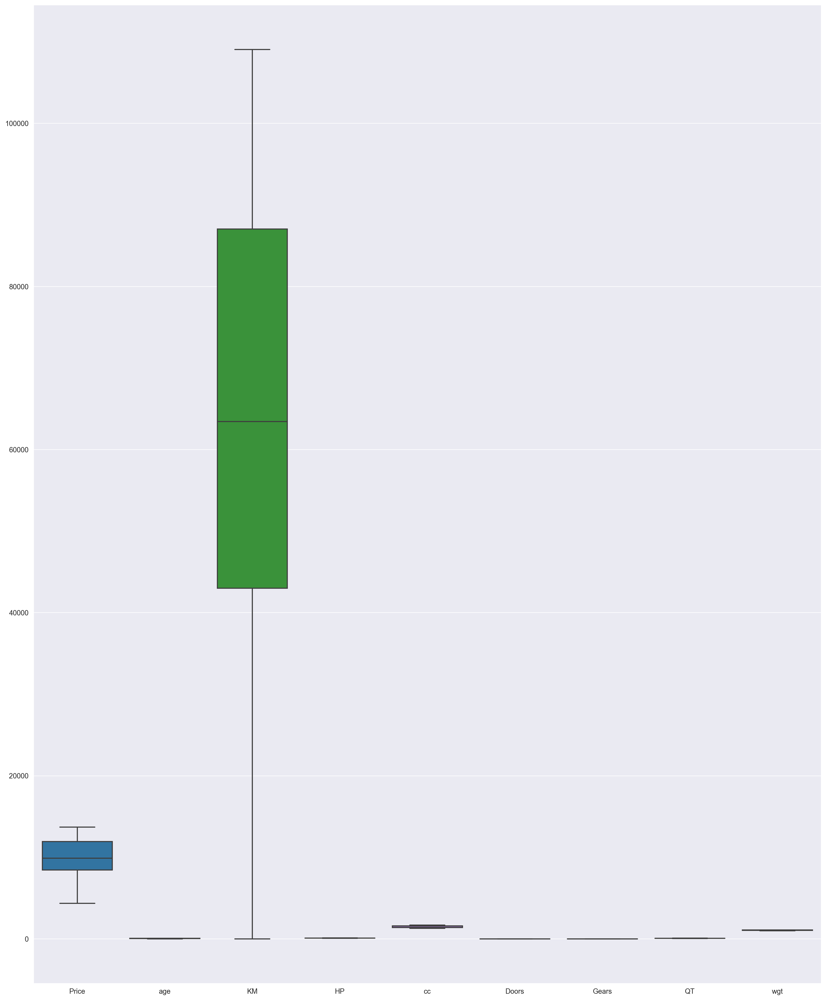

In [146]:
sns.boxplot(df)

In [147]:
#We can drop the column Gears because it has 0 variance

In [148]:
df.drop(columns = 'Gears', inplace = True)

In [149]:
df

,Price,age,KM,HP,cc,Doors,QT,wgt
0,13500,23,46986.0,90,1700,3,93,1107.5
1,13700,23,72937.0,90,1700,3,93,1107.5
2,13700,24,41711.0,90,1700,3,93,1107.5
3,13700,26,48000.0,90,1700,3,93,1107.5
4,13700,30,38500.0,90,1700,3,93,1107.5
...,...,...,...,...,...,...,...,...
1430,7500,69,20544.0,86,1300,3,69,1025.0
1431,10845,72,19000.0,86,1300,3,69,1015.0
1432,8500,71,17016.0,86,1300,3,69,1015.0
1433,7250,70,16916.0,86,1300,3,69,1015.0


In [150]:
df.corr()

,Price,age,KM,HP,cc,Doors,QT,wgt
Price,1.000000,-0.852905,-0.620738,0.251677,0.146122,0.194174,0.284195,0.421718
age,-0.852905,1.000000,0.580520,-0.114323,-0.121044,-0.146704,-0.244241,-0.449072
KM,-0.620738,0.580520,1.000000,-0.263873,0.126694,-0.043048,0.018755,-0.077241
HP,0.251677,-0.114323,-0.263873,1.000000,0.381966,0.129484,0.003858,0.071541
cc,0.146122,-0.121044,0.126694,0.381966,1.000000,0.169709,0.413032,0.651063
Doors,0.194174,-0.146704,-0.043048,0.129484,0.169709,1.000000,0.309418,0.422411
QT,0.284195,-0.244241,0.018755,0.003858,0.413032,0.309418,1.000000,0.582110
wgt,0.421718,-0.449072,-0.077241,0.071541,0.651063,0.422411,0.582110,1.000000


<Axes: >

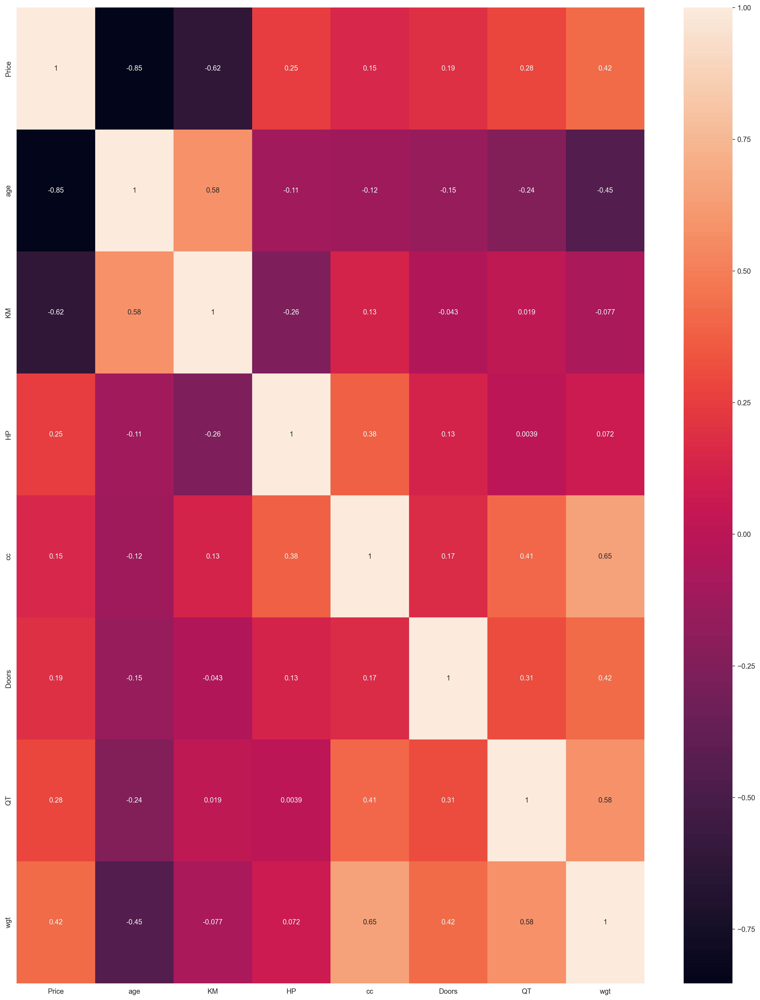

In [151]:
sns.heatmap(df.corr(), annot = True)

In [152]:
# Multicolinearity

In [153]:
vif_data = df.iloc[:, 1:8]
vif_data

,age,KM,HP,cc,Doors,QT,wgt
0,23,46986.0,90,1700,3,93,1107.5
1,23,72937.0,90,1700,3,93,1107.5
2,24,41711.0,90,1700,3,93,1107.5
3,26,48000.0,90,1700,3,93,1107.5
4,30,38500.0,90,1700,3,93,1107.5
...,...,...,...,...,...,...,...
1430,69,20544.0,86,1300,3,69,1025.0
1431,72,19000.0,86,1300,3,69,1015.0
1432,71,17016.0,86,1300,3,69,1015.0
1433,70,16916.0,86,1300,3,69,1015.0


In [154]:
vif_data.values

array([[2.3000e+01, 4.6986e+04, 9.0000e+01, ..., 3.0000e+00, 9.3000e+01,
        1.1075e+03],
       [2.3000e+01, 7.2937e+04, 9.0000e+01, ..., 3.0000e+00, 9.3000e+01,
        1.1075e+03],
       [2.4000e+01, 4.1711e+04, 9.0000e+01, ..., 3.0000e+00, 9.3000e+01,
        1.1075e+03],
       ...,
       [7.1000e+01, 1.7016e+04, 8.6000e+01, ..., 3.0000e+00, 6.9000e+01,
        1.0150e+03],
       [7.0000e+01, 1.6916e+04, 8.6000e+01, ..., 3.0000e+00, 6.9000e+01,
        1.0150e+03],
       [7.6000e+01, 1.0000e+00, 1.1000e+02, ..., 5.0000e+00, 4.5000e+01,
        1.1075e+03]])

In [155]:
range(len(vif_data.columns))

range(0, 7)

In [156]:
vif_data.columns

Index(['age', 'KM', 'HP', 'cc', 'Doors', 'QT', 'wgt'], dtype='object')

In [157]:
VIF = pd.DataFrame()

In [158]:
VIF['Features'] = vif_data.columns

In [159]:
VIF

,Features
0,age
1,KM
2,HP
3,cc
4,Doors
5,QT
6,wgt


In [160]:
VIF['vif_val'] = [variance_inflation_factor(vif_data,i) for i in range(len(vif_data.columns))]

In [161]:
VIF

,Features,vif_val
0,age,16.284221
1,KM,11.183596
2,HP,86.433202
3,cc,277.068561
4,Doors,22.221347
5,QT,66.159699
6,wgt,270.582354


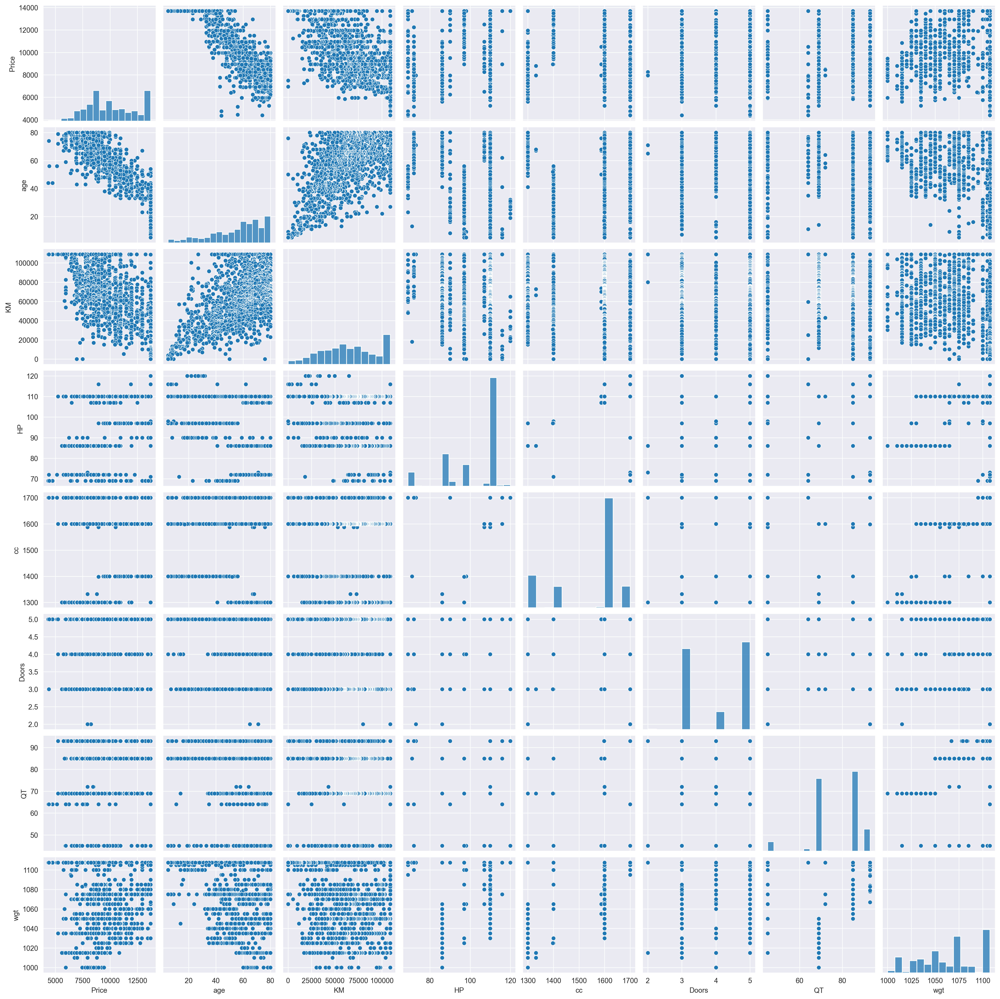

In [162]:
sns.pairplot(df)

In [163]:
model = smf.ols('Price ~ age+KM+HP+cc+Doors+QT+wgt', data = df).fit()
model.pvalues

Intercept     9.203947e-09
age          3.216466e-224
KM            5.606780e-24
HP            1.060394e-17
cc            3.135937e-02
Doors         1.061106e-01
QT            8.437990e-11
wgt           3.846055e-02
dtype: float64

In [164]:
model.rsquared_adj

0.7786525672196469

In [165]:
cc = smf.ols('Price ~ age+KM+HP+Doors+cc+QT', data = df).fit()
cc.pvalues, cc.rsquared_adj

(Intercept    2.173636e-162
 age          2.687072e-260
 KM            2.918297e-24
 HP            6.226821e-17
 Doors         7.652754e-03
 cc            2.896604e-01
 QT            1.555616e-13
 dtype: float64,
 0.7781422154484697)

In [166]:
wgt = smf.ols('Price ~ age+KM+HP+Doors+QT+wgt', data = df).fit()
wgt.pvalues, wgt.rsquared_adj

(Intercept     5.615623e-16
 age          1.937559e-229
 KM            3.323051e-28
 HP            5.646493e-19
 Doors         2.220613e-02
 QT            2.730109e-10
 wgt           3.795031e-01
 dtype: float64,
 0.7780879856540082)

In [167]:
age = smf.ols('Price ~ age+HP+Doors+cc+QT', data = df).fit()
age.pvalues, age.rsquared_adj

(Intercept    9.034371e-162
 age           0.000000e+00
 HP            1.484892e-34
 Doors         2.275482e-02
 cc            8.285515e-06
 QT            1.376524e-11
 dtype: float64,
 0.7616637311905325)

In [168]:
KM = smf.ols('Price ~ KM+HP+Doors+cc+QT', data = df).fit()
KM.pvalues, KM.rsquared_adj

(Intercept     1.760677e-25
 KM           7.230769e-160
 HP            1.017531e-01
 Doors         2.384615e-04
 cc            1.253348e-05
 QT            1.430045e-24
 dtype: float64,
 0.49050277602218506)

In [169]:
# Selection of model
'''We are selecting the age model as cc & wgt were multicolinear we selected the model with higher R2
and also age and kM were multicolinear so we selected the model with higher R2''' 

'We are selecting the age model as cc & wgt were multicolinear we selected the model with higher R2\nand also age and kM were multicolinear so we selected the model with higher R2'

In [170]:
mod = smf.ols('Price ~ age+HP+Doors+cc+QT', data = df).fit()
mod.pvalues, mod.rsquared_adj

(Intercept    9.034371e-162
 age           0.000000e+00
 HP            1.484892e-34
 Doors         2.275482e-02
 cc            8.285515e-06
 QT            1.376524e-11
 dtype: float64,
 0.7616637311905325)

In [171]:
mod.pvalues, mod.rsquared_adj, mod.fittedvalues, mod.resid

(Intercept    9.034371e-162
 age           0.000000e+00
 HP            1.484892e-34
 Doors         2.275482e-02
 cc            8.285515e-06
 QT            1.376524e-11
 dtype: float64,
 0.7616637311905325,
 0       13031.790633
 1       13031.790633
 2       12933.977080
 3       12738.349974
 4       12347.095760
             ...     
 1430     8398.347976
 1431     8104.907316
 1432     8202.720869
 1433     8300.534422
 1434     7784.468216
 Length: 1435, dtype: float64,
 0        468.209367
 1        668.209367
 2        766.022920
 3        961.650026
 4       1352.904240
            ...     
 1430    -898.347976
 1431    2740.092684
 1432     297.279131
 1433   -1050.534422
 1434    -834.468216
 Length: 1435, dtype: float64)

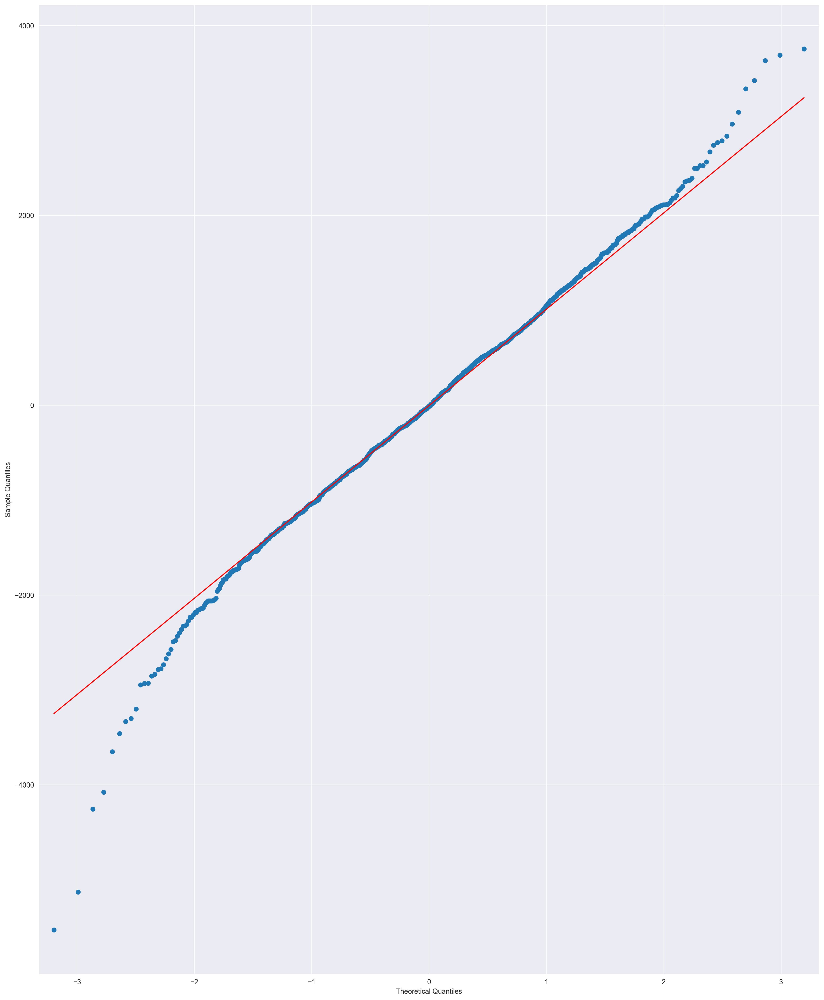

In [172]:
#Q-Q plot(Errors normally distributed or not)
sm.qqplot(mod.resid, line ='q');

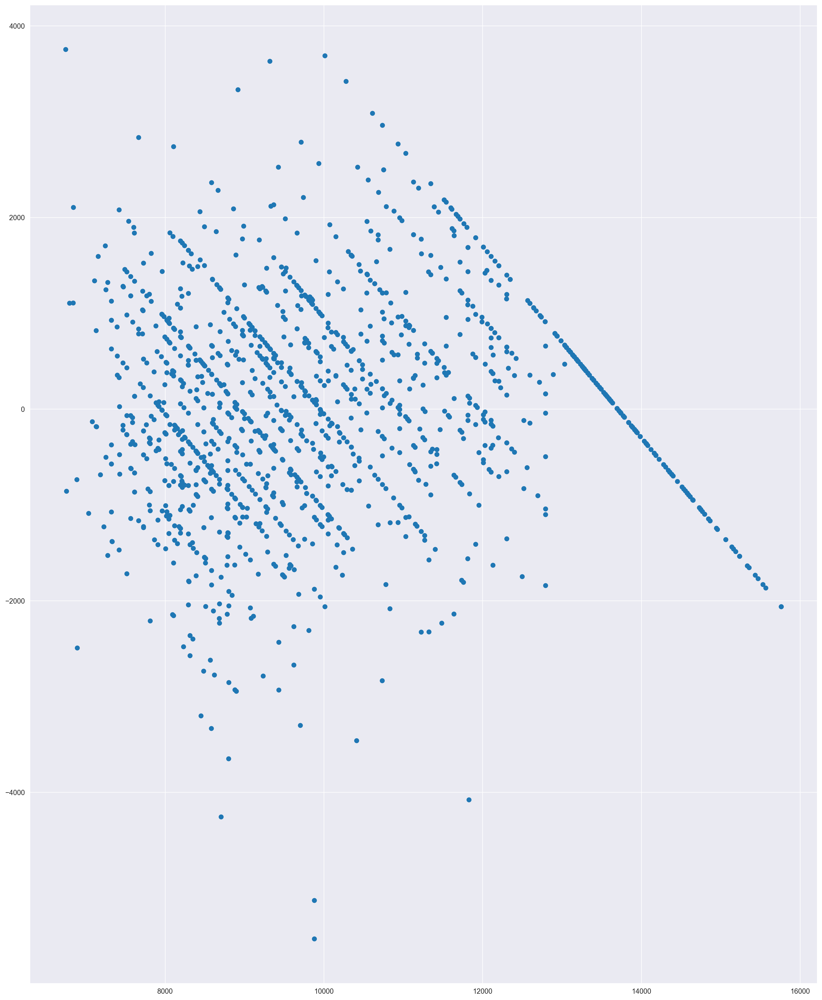

In [173]:
#Errors VS fitted Values (No Pattern Should be present)
plt.scatter(mod.fittedvalues, mod.resid)

eval_env: 1


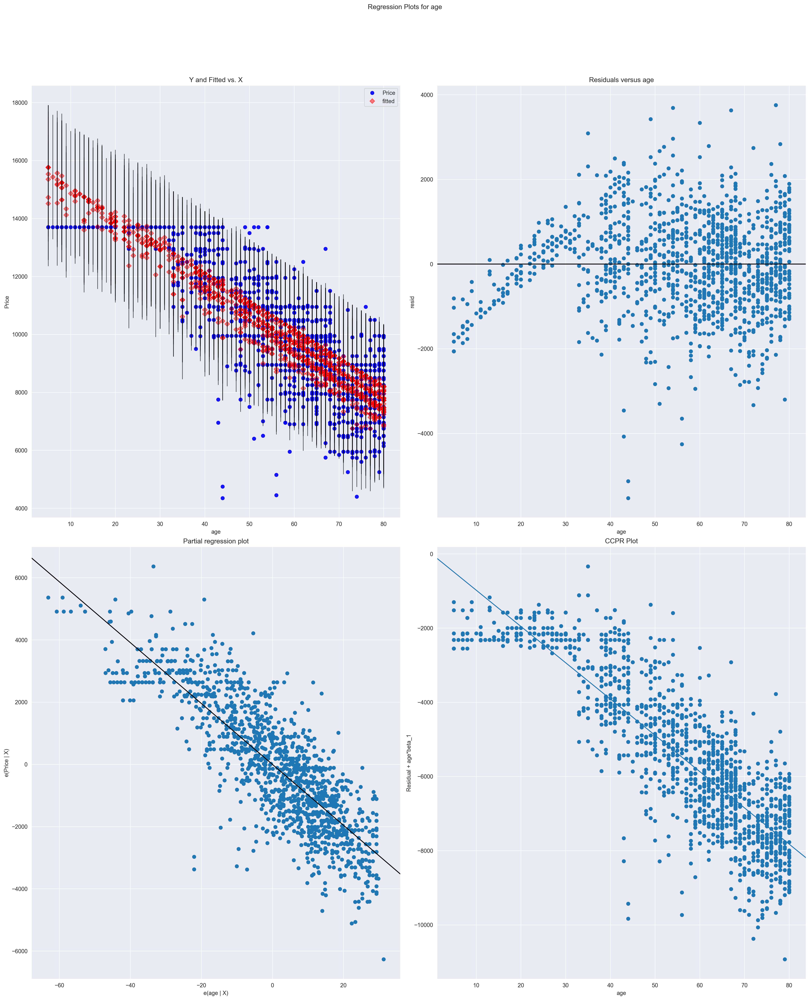

In [174]:
# Errors Vs Regressors/Features
#age
sm.graphics.plot_regress_exog(mod,'age');

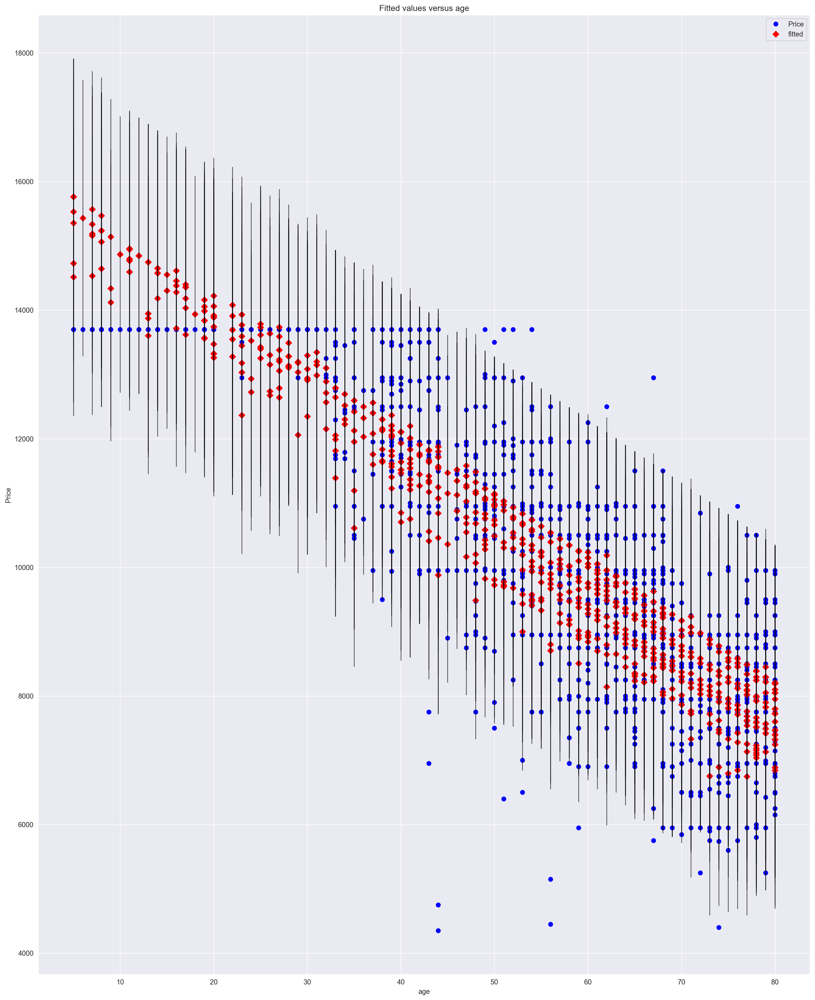

In [175]:
sm.graphics.plot_fit(mod,'age');

In [176]:
#Calculating influence Data Points

inf = mod.get_influence()
inf

In [177]:
#Cook's Distance
inf.cooks_distance

(array([2.21286149e-04, 4.50712033e-04, 5.80992545e-04, ...,
        4.63500738e-05, 5.72878050e-04, 1.09902107e-03]),
 array([1.        , 1.        , 1.        , ..., 1.        , 1.        ,
        0.99999999]))

In [178]:
c, p = inf.cooks_distance

In [179]:
c

array([2.21286149e-04, 4.50712033e-04, 5.80992545e-04, ...,
       4.63500738e-05, 5.72878050e-04, 1.09902107e-03])

<StemContainer object of 3 artists>

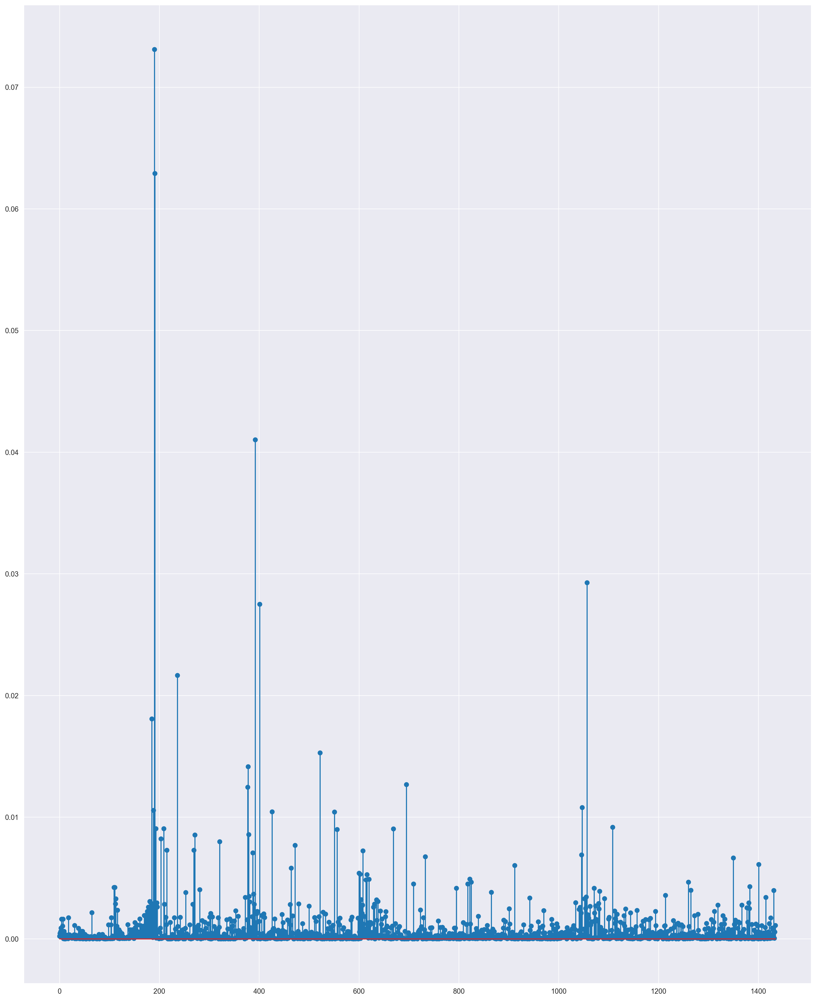

In [180]:
plt.stem(c)

In [181]:
#Every Value is less than 1

In [182]:
n = len(df)
n

1435

In [183]:
list(np.where(mod.resid < -4000))

[array([188, 190, 191, 392], dtype=int64)]

In [184]:
df.drop(index = [188,190, 191, 392], inplace = True)

In [185]:
df.reset_index(inplace = True)
df.drop(columns = 'index', inplace = True)
df

,Price,age,KM,HP,cc,Doors,QT,wgt
0,13500,23,46986.0,90,1700,3,93,1107.5
1,13700,23,72937.0,90,1700,3,93,1107.5
2,13700,24,41711.0,90,1700,3,93,1107.5
3,13700,26,48000.0,90,1700,3,93,1107.5
4,13700,30,38500.0,90,1700,3,93,1107.5
...,...,...,...,...,...,...,...,...
1426,7500,69,20544.0,86,1300,3,69,1025.0
1427,10845,72,19000.0,86,1300,3,69,1015.0
1428,8500,71,17016.0,86,1300,3,69,1015.0
1429,7250,70,16916.0,86,1300,3,69,1015.0


In [186]:
model = smf.ols('Price ~ age+HP+Doors+cc+QT', data = df).fit()
model.pvalues, model.rsquared_adj

(Intercept    4.669761e-170
 age           0.000000e+00
 HP            1.478030e-28
 Doors         4.578373e-03
 cc            8.817754e-04
 QT            3.711189e-09
 dtype: float64,
 0.7717717296948952)

In [187]:
df.head(20)

,Price,age,KM,HP,cc,Doors,QT,wgt
0,13500,23,46986.0,90,1700,3,93,1107.5
1,13700,23,72937.0,90,1700,3,93,1107.5
2,13700,24,41711.0,90,1700,3,93,1107.5
3,13700,26,48000.0,90,1700,3,93,1107.5
4,13700,30,38500.0,90,1700,3,93,1107.5
5,12950,32,61000.0,90,1700,3,93,1107.5
6,13700,27,94612.0,90,1700,3,93,1107.5
7,13700,30,75889.0,90,1700,3,93,1107.5
8,13700,27,19700.0,120,1700,3,93,1107.5
9,12950,23,71138.0,69,1700,3,93,1105.0


In [188]:
test = pd.DataFrame({ 'age' : [24,26,27,21,32],
                     'KM': [15000,15743,12845,14536,70003],
                    'HP' : [110,100,90,120,70],
                     'cc': [1600,1700,1500,1300,1400],
                    'Doors' : [3,4,2,3,4],
                     'QT': [84,93,75,56,86],
                    'wgt': [1104,1105,1106,1110,1109]})

In [189]:
test

,age,KM,HP,cc,Doors,QT,wgt
0,24,15000,110,1600,3,84,1104
1,26,15743,100,1700,4,93,1105
2,27,12845,90,1500,2,75,1106
3,21,14536,120,1300,3,56,1110
4,32,70003,70,1400,4,86,1109


In [190]:
model.predict(test)

0    13494.427070
1    13172.497545
2    12478.305649
3    13851.840699
4    11876.147326
dtype: float64